## 一.Softmax回归
    和线性回归不同，softmax 回归的输出单元从一个变成了多个，且引入了 softmax 运算使得输出更适合离散值的预测和训练。
### 1.Softmax 回归模型
    Softmax 回归跟线性回归一样将输入特征与权重做线性叠加。
    与线性回归的一个主要不同在于，softmax 回归的输出值个数等于标签里的类别数。
#### 1.1 Softmax运算
分类问题需要得到离散的预测输出，一个简单的办法是将输出值 $o_i$ 当做预测类别是 i 的置信度，并将值最大的输出所对应的类作为预测输出，即输出 $argmax_io_i$。

问题：
    一方面，由于输出层的输出值的范围不确定，我们难以直观上判断这些值的意义。
    
    另一方面，由于真实标签是离散值，这些离散值与不确定范围的输出值之间的误差难以衡量。
    
Softmax 运算符（softmax operator）解决了以上两个问题，通过下式将输出值变换成值为正且和为 1 的概率分布：

$$\hat{y}_1,\hat{y}_2,\hat{y}_3=\text{softmax}(o_1,o_2,o_3)$$
其中：$$ \hat{y}_1 = \frac{ \exp(o_1)}{\sum_{i=1}^3 \exp(o_i)},\quad \hat{y}_2 = \frac{ \exp(o_2)}{\sum_{i=1}^3 \exp(o_i)},\quad \hat{y}_3 = \frac{ \exp(o_3)}{\sum_{i=1}^3 \exp(o_i)}. $$

注意:

$$\operatorname{argmax}_i o_i = \operatorname{argmax}_i\hat y_i,$$

因此softmax运算不改变预测类别输出。

## 二.SOftmax--从0开始实现

In [9]:
%matplotlib inline
import gluonbook as gb
from mxnet import autograd,nd

### 1.获取和读取数据

In [10]:
batch_size=256
train_iter,test_iter=gb.load_data_fashion_mnist(batch_size)

### 2.初始化模型参数

In [11]:
num_inputs=784
num_outputs=10

W=nd.random.normal(scale=0.01,shape=(num_inputs,num_outputs))
b=nd.zeros(num_outputs)

In [12]:
# 对模型参数附上梯度
W.attach_grad()
b.attach_grad()

### 3.实现Softmax运算


In [13]:
# 在下面例子中，给定一个 NDArray 矩阵X。
# 我们可以只对其中同一列（axis=0）或同一行（axis=1）的元素求和，并在结果中保留行和列这两个维度（keepdims=True）。

X=nd.array([[1,2,3],[4,5,6]])
X.sum(axis=0,keepdims=True),X.sum(axis=1,keepdims=True)

(
 [[ 5.  7.  9.]]
 <NDArray 1x3 @cpu(0)>, 
 [[  6.]
  [ 15.]]
 <NDArray 2x1 @cpu(0)>)

In [14]:
# 矩阵X的行数是样本数，列数是输出个数。
# 为了表达样本预测各个输出的概率，softmax 运算会先通过exp函数对每个元素做指数运算，再对exp矩阵同行元素求和，最后令矩阵每行各元素与该行元素之和相除
# 最终的到的矩阵每行元素和为1且非负，因此矩阵每行都是合法的概率分布
# Softmax 运算的输出矩阵中的任意一行元素代表了一个样本在各个输出类别上的预测概率。

def softmax(X):
    X_exp=X.exp()
    print("X_exp:",X_exp)
    partition=X_exp.sum(axis=1,keepdims=True)
    print("partition:",partition)
    return X_exp/partition  # 广播机制

In [15]:
X=nd.random.normal(shape=(2,5))
print("X:",X)
X_prob=softmax(X)
X_prob,X_prob.sum(axis=1)

X: 
[[ 1.79744768  0.19594947 -1.7376399   0.04734707  0.14580931]
 [ 0.32604918  0.45787829 -0.89425808  0.49383944 -0.90434271]]
<NDArray 2x5 @cpu(0)>
X_exp: 
[[ 6.03422642  1.21646547  0.17593513  1.04848588  1.15697551]
 [ 1.3854835   1.58071661  0.40891087  1.63859546  0.40480787]]
<NDArray 2x5 @cpu(0)>
partition: 
[[ 9.63208866]
 [ 5.41851425]]
<NDArray 2x1 @cpu(0)>


(
 [[ 0.62647122  0.126293    0.01826552  0.10885343  0.12011679]
  [ 0.25569436  0.2917251   0.0754655   0.30240679  0.07470828]]
 <NDArray 2x5 @cpu(0)>, 
 [ 0.99999994  1.        ]
 <NDArray 2 @cpu(0)>)

### 4.定义模型

In [16]:
def net(X):
    return softmax(nd.dot(X.reshape(-1,num_inputs),W)+b)

### 5.定义损数

In [17]:
y_hat=nd.array([[0.1,0.3,0.6],[0.3,0.2,0.5]])
y=nd.array([0,2])
nd.pick(y_hat,y)


[ 0.1  0.5]
<NDArray 2 @cpu(0)>

In [18]:
# 交叉熵损失函数
def cross_entropy(y_hat,y):
    return -nd.pick(y_hat,y).log()

### 6.计算分类准确率

In [19]:
# 给定一个类别的预测概率分布y_hat，我们把预测概率最大的类别作为输出类别。
# 如果它与真实类别y一致，说明这次预测是正确的。
# 分类准确率即正确预测数量与总预测数量之比。

# 本函数已保存在 gluonbook 包中方便以后使用。
def accuracy(y_hat,y):
    return (y_hat.argmax(axis=1) == y.astype('float32')).mean().asscalar()

In [20]:
accuracy(y_hat,y)

0.5

In [21]:
# 本函数已保存在 gluonbook 包中方便以后使用。该函数将被逐步改进：它的完整实现将在“图像增广”一节中描述。
def evaluate_accuracy(data_iter,net):
    acc=0
    for X,y in data_iter:
        acc+=accuracy(net(X),y)
    return acc/len(data_iter)

In [22]:
evaluate_accuracy(test_iter,net)

X_exp: 
[[ 0.86964345  0.9863078   1.09777415 ...,  0.97932178  1.27904689
   0.85647988]
 [ 0.96414614  0.99343473  1.17729795 ...,  0.88198465  1.29619777
   0.79740936]
 [ 0.85277969  0.90114987  1.07537436 ...,  1.01664674  1.15349174
   0.95402801]
 ..., 
 [ 0.69981724  0.88147628  1.14079082 ...,  0.84595406  1.41296709
   0.75970793]
 [ 0.69428664  0.84327465  1.02789021 ...,  0.89232898  1.50801122
   0.76537108]
 [ 0.74707848  0.83533788  1.18731093 ...,  0.79225546  1.18586183
   0.78233099]]
<NDArray 256x10 @cpu(0)>
partition: 
[[ 10.01735115]
 [ 10.07215405]
 [  9.9448061 ]
 [ 10.02002525]
 [ 10.19023418]
 [  9.6986866 ]
 [  9.88505268]
 [  9.73975849]
 [  9.66815472]
 [  9.97572327]
 [  9.92454433]
 [  9.7820816 ]
 [  9.71919346]
 [  9.78397179]
 [  9.64151764]
 [  9.86661625]
 [  9.89776993]
 [  9.84885597]
 [  9.62562752]
 [  9.91511059]
 [  9.82730198]
 [  9.61684799]
 [  9.9514513 ]
 [ 10.39075279]
 [ 10.06480598]
 [  9.96779919]
 [  9.36370373]
 [ 10.10643196]
 [  9.5

X_exp: 
[[ 0.78640836  0.93002528  1.16143239 ...,  0.86012942  1.17520332
   0.87788659]
 [ 0.8024984   0.93879777  1.04080296 ...,  1.00375473  1.27892339
   0.80266982]
 [ 1.01161051  1.09606075  1.02310669 ...,  0.86721969  1.29728091
   0.71544951]
 ..., 
 [ 0.70087767  0.88382673  1.08190703 ...,  1.07081711  1.05148399
   0.92684174]
 [ 0.7733978   0.86655343  1.2930249  ...,  0.88980907  1.11349678
   0.87729776]
 [ 0.87734425  0.95891446  1.04471636 ...,  0.95918381  1.09281886
   0.8551653 ]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  9.74698925]
 [  9.82159138]
 [  9.89312077]
 [ 10.059865  ]
 [  9.32187462]
 [  9.78712463]
 [  9.69981003]
 [ 10.12433052]
 [  9.61780834]
 [  9.85967827]
 [  9.86728573]
 [  9.62622547]
 [  9.79378319]
 [  9.80811501]
 [  9.15627289]
 [  9.92361355]
 [  9.77726173]
 [  9.77119827]
 [  9.47563457]
 [  9.8443346 ]
 [  9.79039574]
 [ 10.0685215 ]
 [  9.88819313]
 [  9.87359715]
 [  9.60382462]
 [  9.85546112]
 [  9.52495766]
 [  9.68762589]
 [  9.5

X_exp: 
[[ 0.8900606   0.876275    1.04938936 ...,  0.87027854  1.25471818
   0.92329049]
 [ 0.89770752  0.87605739  1.08157063 ...,  0.90401852  1.08543897
   0.88938349]
 [ 0.87067008  1.04879117  1.03445196 ...,  0.94224328  1.26657915
   0.82370758]
 ..., 
 [ 0.71972221  0.83234119  1.06019759 ...,  0.90156007  1.34033108
   0.90289205]
 [ 0.97277027  1.01781261  1.03858972 ...,  0.87823951  1.15297878
   0.95698786]
 [ 0.82130998  0.93585277  1.04626012 ...,  1.06552935  1.06405401
   0.97440082]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  9.9401474 ]
 [  9.79605961]
 [ 10.07829285]
 [  9.40513039]
 [ 10.0637846 ]
 [  9.81054306]
 [  9.8776598 ]
 [ 10.06362247]
 [  9.79934597]
 [ 10.07136154]
 [  9.86920929]
 [  9.90348721]
 [ 10.00215912]
 [ 10.0485611 ]
 [ 10.09923363]
 [  9.93576622]
 [  9.87513351]
 [  9.87569046]
 [  9.67459583]
 [  9.94495106]
 [  9.62201118]
 [  9.91494751]
 [ 10.08395576]
 [  9.81936169]
 [  9.91418171]
 [ 10.02460861]
 [  9.79685402]
 [ 10.04443169]
 [  9.9

0.087988281249999994

### 7.训练模型

In [23]:
num_epochs,lr=5,0.1

# 本函数已保存在 gluonbook 包中方便以后使用。
def train_ch3(net,train_iter,test_iter,loss,num_epochs,batch_size,params=None,lr=None,trainer=None):
    for epoch in range(num_epochs):
        train_l_sum = 0
        train_acc_sum = 0
        for X, y in train_iter:
            with autograd.record():
                y_hat = net(X)
                l = loss(y_hat, y)
            l.backward()
            if trainer is None:
                gb.sgd(params, lr, batch_size)
            else:
                trainer.step(batch_size)  # 下一节将用到。
            train_l_sum += l.mean().asscalar()
            train_acc_sum += accuracy(y_hat, y)
        test_acc = evaluate_accuracy(test_iter, net)
        print('epoch %d, loss %.4f, train acc %.3f, test acc %.3f'
              % (epoch + 1, train_l_sum / len(train_iter),
                 train_acc_sum / len(train_iter), test_acc))

train_ch3(net, train_iter, test_iter, cross_entropy, num_epochs,batch_size, [W, b], lr)

X_exp: 
[[ 0.73240262  0.87980902  1.2018292  ...,  0.98358721  1.33096576
   0.83110285]
 [ 0.74707395  0.78993326  1.08105612 ...,  0.84567493  1.26957786
   0.880831  ]
 [ 0.75397241  0.85999233  1.0117929  ...,  0.96390158  1.27747202
   0.86663127]
 ..., 
 [ 0.82565761  0.89128506  1.06926477 ...,  0.98543775  1.19101083
   0.90732187]
 [ 0.83876455  0.85963923  0.99312812 ...,  0.86357564  0.97245407
   0.97904181]
 [ 0.84262949  0.89718086  1.11580563 ...,  0.81683707  1.3336606
   0.79467392]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  9.6917429 ]
 [  9.77882576]
 [  9.98062992]
 [ 10.04688263]
 [  9.74527264]
 [  9.80383205]
 [  9.91941547]
 [  9.88430595]
 [  9.75617599]
 [  9.94099236]
 [ 10.00433826]
 [  9.61233902]
 [ 10.08228493]
 [  9.94417858]
 [  9.76382446]
 [  9.68252659]
 [  9.56931877]
 [  9.8934288 ]
 [  9.75893021]
 [  9.66059399]
 [  9.74056053]
 [  9.85682201]
 [ 10.02639389]
 [  9.52237034]
 [  9.31694698]
 [ 10.01304436]
 [  9.60849285]
 [  9.99901104]
 [  9.79

partition: 
[[ 14.52000904]
 [ 15.27199554]
 [ 26.71481323]
 [ 11.15997219]
 [ 20.27475739]
 [ 12.4699688 ]
 [ 10.95625687]
 [ 43.31454086]
 [ 38.88555527]
 [ 14.83390713]
 [ 43.13575363]
 [ 11.07752132]
 [ 45.06177139]
 [ 24.65672874]
 [ 34.26932144]
 [ 22.56663895]
 [ 48.38088226]
 [ 18.7293663 ]
 [ 24.70791054]
 [ 13.07909203]
 [ 10.85155296]
 [ 17.21734238]
 [ 18.27515221]
 [ 52.6606102 ]
 [ 23.39915466]
 [ 21.0646019 ]
 [ 16.50445557]
 [ 23.77955055]
 [ 22.00708771]
 [ 22.30768967]
 [ 20.06916809]
 [ 12.36658478]
 [ 27.08947372]
 [ 19.15420151]
 [ 39.66595459]
 [ 15.26669693]
 [ 42.46315002]
 [ 43.23984909]
 [ 15.33342266]
 [ 23.03104973]
 [ 28.26650429]
 [ 23.49591255]
 [ 50.08825302]
 [ 18.02443504]
 [ 23.68013763]
 [ 23.79656792]
 [ 12.43085575]
 [ 21.02999496]
 [ 25.06723785]
 [ 38.35498428]
 [ 14.22636604]
 [ 12.96146011]
 [ 37.98828888]
 [ 21.89434242]
 [ 23.26517677]
 [ 13.7135849 ]
 [ 11.87221718]
 [ 37.55451202]
 [ 17.44193268]
 [ 12.23595715]
 [ 15.80190468]
 [ 17.837987

partition: 
[[  39.59577179]
 [  53.61816406]
 [ 135.47462463]
 [  58.60105133]
 [  64.69063568]
 [  19.12746048]
 [  56.17212677]
 [  29.12623405]
 [  62.26626587]
 [  37.47251511]
 [  83.28499603]
 [  95.40151978]
 [  15.88692951]
 [  19.92212868]
 [  76.19598389]
 [  25.73243713]
 [  74.01585388]
 [  12.10179615]
 [  29.27190018]
 [  21.09743309]
 [  26.5818634 ]
 [  15.5632267 ]
 [  23.78001785]
 [  23.85142899]
 [  29.19979095]
 [  11.07869911]
 [  15.96602058]
 [  53.6692543 ]
 [  33.79817963]
 [  32.88508606]
 [  29.97253418]
 [  17.17879677]
 [  65.01526642]
 [  48.00750732]
 [ 120.88071442]
 [ 110.91253662]
 [  46.94248962]
 [  35.97416306]
 [  16.87238312]
 [  93.24073029]
 [  28.52256966]
 [  19.51927567]
 [  13.22521114]
 [  11.18042946]
 [  76.26959991]
 [  56.37470627]
 [  31.9576149 ]
 [  62.69542313]
 [  15.80523586]
 [  33.10171509]
 [  79.89001465]
 [  49.3810463 ]
 [  28.95685577]
 [  35.03648758]
 [  13.63528442]
 [  67.89346313]
 [  11.78126049]
 [  21.86158943]
 [

<NDArray 256x10 @cpu(0)>
partition: 
[[  49.53416443]
 [  13.94164944]
 [  14.00438213]
 [ 126.30001831]
 [  31.28608322]
 [  47.1938858 ]
 [  25.69126701]
 [  20.09660339]
 [  34.87278366]
 [  20.42386627]
 [  73.67978668]
 [  66.69474792]
 [  49.08805847]
 [  11.07971382]
 [ 264.28585815]
 [  20.35032272]
 [  31.84524345]
 [  63.92623901]
 [  33.49036789]
 [  15.37966156]
 [  14.41599846]
 [  76.80148315]
 [  16.84604454]
 [  28.39831352]
 [  78.97744751]
 [  12.05245781]
 [  53.18164062]
 [  71.93966675]
 [  84.64004517]
 [  67.66365814]
 [  89.85049438]
 [  31.60050583]
 [  40.0556221 ]
 [ 107.91259003]
 [  98.09783173]
 [  62.11499023]
 [  34.13660431]
 [ 123.89736176]
 [  44.65542984]
 [  41.77008057]
 [  31.58225822]
 [  90.79214478]
 [  48.61356735]
 [  16.07359695]
 [  63.19150543]
 [  55.2339592 ]
 [  17.74793053]
 [  53.32836533]
 [ 141.03157043]
 [  11.92947769]
 [  78.50009155]
 [ 132.85209656]
 [ 124.35960388]
 [ 143.61486816]
 [  97.83704376]
 [  14.76531029]
 [  62.0617

partition: 
[[  77.51248169]
 [  92.76748657]
 [ 167.63735962]
 [  69.13704681]
 [  78.13555908]
 [  52.9316597 ]
 [  13.21088219]
 [  14.06473637]
 [  79.35482025]
 [  50.45271301]
 [ 182.34695435]
 [  58.48898697]
 [  15.16473198]
 [ 110.62615204]
 [  14.29820251]
 [  43.80939102]
 [  42.55168152]
 [ 170.35595703]
 [  59.31727982]
 [  17.36131668]
 [ 124.37548828]
 [ 232.77650452]
 [  21.22733307]
 [  42.92728806]
 [ 185.50219727]
 [  30.58390999]
 [ 194.16142273]
 [ 118.6155777 ]
 [  22.0367012 ]
 [  95.7208252 ]
 [  72.82454681]
 [  90.24672699]
 [  13.91139984]
 [  39.13695526]
 [  40.01784515]
 [  13.4493494 ]
 [  72.42948151]
 [  74.10914612]
 [  67.27459717]
 [  25.6061039 ]
 [ 245.27127075]
 [  24.56541061]
 [  39.62285233]
 [  14.49634457]
 [  15.80877972]
 [  81.10686493]
 [ 462.49664307]
 [  13.86884594]
 [ 132.7401886 ]
 [  11.24542427]
 [ 109.6824646 ]
 [ 264.93960571]
 [  67.79421234]
 [  38.63088608]
 [  66.28821564]
 [  88.86608124]
 [ 104.70487213]
 [  36.91914368]
 [

partition: 
[[ 674.71398926]
 [ 105.2440033 ]
 [ 142.10694885]
 [ 142.84921265]
 [ 113.57296753]
 [  40.04450607]
 [  53.73502731]
 [ 277.21322632]
 [ 468.89245605]
 [  83.08451843]
 [  47.09801102]
 [  74.65581512]
 [  27.98250771]
 [ 166.45301819]
 [  29.21651459]
 [ 199.18200684]
 [ 120.09621429]
 [ 332.19830322]
 [  14.82221699]
 [  13.08778763]
 [ 127.53686523]
 [ 228.4259491 ]
 [ 176.2003479 ]
 [ 185.84588623]
 [  59.15867233]
 [  83.47286987]
 [  19.78555679]
 [  43.27410126]
 [  47.45639038]
 [  18.24869347]
 [  30.81089211]
 [ 163.84544373]
 [  89.60256195]
 [  16.68263817]
 [  36.4552536 ]
 [  17.87386513]
 [  33.57920074]
 [  27.63698006]
 [  72.94213867]
 [ 180.73297119]
 [  31.78205109]
 [ 126.66596222]
 [  14.80346394]
 [  15.90549374]
 [ 146.35058594]
 [ 133.31535339]
 [ 124.66038513]
 [  74.44971466]
 [ 204.56460571]
 [  41.93959427]
 [ 183.43081665]
 [ 388.35046387]
 [  25.11995506]
 [  12.99375629]
 [  98.50708008]
 [ 126.31043243]
 [  92.44728088]
 [  25.65127945]
 [

partition: 
[[  309.41943359]
 [   61.91725922]
 [  143.9128418 ]
 [   14.05275059]
 [  162.51777649]
 [   50.02635574]
 [   44.13999939]
 [   47.36668777]
 [  284.26824951]
 [   31.18510437]
 [   39.08966827]
 [  100.23781586]
 [   90.11649323]
 [  139.48321533]
 [   31.49790192]
 [   44.01425171]
 [  418.92471313]
 [  121.07884979]
 [  170.18139648]
 [  508.38851929]
 [  148.99765015]
 [   75.14195251]
 [   95.1938858 ]
 [   35.68299484]
 [   68.31365204]
 [   35.55374146]
 [  155.87384033]
 [   98.3449707 ]
 [  122.99240875]
 [   92.32202911]
 [  170.23995972]
 [  172.15838623]
 [   65.15301514]
 [   80.59732056]
 [  178.54011536]
 [  134.75468445]
 [  138.71682739]
 [   34.87036514]
 [  259.61608887]
 [   26.97062111]
 [   20.18619728]
 [   59.95423126]
 [   46.31314087]
 [   32.23761749]
 [   77.32633209]
 [   74.35881042]
 [   61.47538757]
 [   21.24011612]
 [   42.51917648]
 [   11.03168392]
 [   12.66414452]
 [  283.19018555]
 [  162.47862244]
 [  223.06332397]
 [   44.99146271

<NDArray 256x10 @cpu(0)>
partition: 
[[   65.70815277]
 [   19.31066704]
 [   17.80773163]
 [  354.09185791]
 [  146.43069458]
 [   11.49686527]
 [  302.14447021]
 [   29.92142677]
 [  349.20196533]
 [   18.00688171]
 [  202.46659851]
 [   22.33759308]
 [   41.82217026]
 [   19.74587059]
 [  207.85125732]
 [   30.91295433]
 [   22.32077408]
 [   52.11560822]
 [   33.905056  ]
 [   51.53793716]
 [  203.41812134]
 [  196.52577209]
 [  116.76042938]
 [  218.6880188 ]
 [   49.44971848]
 [  138.96913147]
 [   36.65032578]
 [   51.18274689]
 [  134.51513672]
 [   96.83640289]
 [  169.03504944]
 [   11.62543488]
 [  205.95500183]
 [  193.36529541]
 [  129.08227539]
 [   88.97652435]
 [  100.30432129]
 [   30.73353767]
 [   90.5252533 ]
 [   16.66718102]
 [   67.93280792]
 [   34.88470078]
 [  172.22753906]
 [  123.40028381]
 [   97.3042984 ]
 [   15.48055172]
 [   15.04735374]
 [   23.87496567]
 [   20.40047455]
 [   54.46967697]
 [   39.2648735 ]
 [   68.87457275]
 [   44.57967758]
 [   24.7

X_exp: 
[[  1.02806072e+01   3.18634957e-02   2.34931622e+01 ...,   2.26621348e-02
    1.17706311e+00   9.10548791e-02]
 [  5.03278449e-02   2.16216277e-02   1.84051305e-01 ...,   1.95143700e+01
    5.03957176e+00   3.32051086e+02]
 [  1.18368499e-01   9.04945135e-02   4.18259412e-01 ...,   4.19783974e+00
    4.83842039e+00   3.35892448e+01]
 ..., 
 [  2.30843902e+00   1.44292328e+02   8.26172471e-01 ...,   6.97691813e-02
    1.39347553e-01   1.83548972e-01]
 [  2.04822883e-01   1.34038609e-02   1.44839811e+00 ...,   8.17737103e-01
    1.90177292e+02   1.46529615e+00]
 [  5.76547661e+01   1.22265494e+00   3.26164293e+00 ...,   8.86110589e-03
    1.90360069e-01   1.02338314e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[   89.43039703]
 [  380.42932129]
 [   52.2172966 ]
 [   64.06158447]
 [  232.17584229]
 [  587.53436279]
 [   55.45867538]
 [  624.44921875]
 [   23.75512695]
 [   23.78448105]
 [  346.8526001 ]
 [  154.37844849]
 [  187.08247375]
 [   15.22522545]
 [  251.70628357]
 [  3

partition: 
[[  448.82922363]
 [ 1525.17175293]
 [  360.93096924]
 [  492.72918701]
 [   13.51262093]
 [  126.75389099]
 [   17.35457802]
 [  181.42405701]
 [  105.95860291]
 [   16.31458092]
 [  321.60305786]
 [  120.67592621]
 [   66.43275452]
 [   83.18660736]
 [  950.23278809]
 [   32.03382111]
 [   29.49141693]
 [   34.76187515]
 [  707.15020752]
 [   36.4884491 ]
 [  212.01300049]
 [   29.5066433 ]
 [  380.1869812 ]
 [   63.91258621]
 [   48.32524872]
 [  141.62693787]
 [  191.30747986]
 [  186.44639587]
 [  132.78863525]
 [   99.64225769]
 [  153.1587677 ]
 [   28.00314903]
 [  349.36807251]
 [  404.13082886]
 [   61.41631317]
 [   90.83094025]
 [   31.80929565]
 [  243.9385376 ]
 [  180.88087463]
 [   20.24162292]
 [   33.8462944 ]
 [  425.88189697]
 [   33.7279892 ]
 [  310.72149658]
 [   31.97716331]
 [   38.73341751]
 [  210.53004456]
 [   29.18805504]
 [  475.78637695]
 [   35.10207367]
 [  126.42005157]
 [ 1430.40771484]
 [   15.23789215]
 [   25.21898079]
 [  225.7328186 

partition: 
[[   55.53611755]
 [  104.84866333]
 [  533.24487305]
 [  195.81521606]
 [   46.73476028]
 [   59.25503922]
 [   85.73854065]
 [   88.57048798]
 [   19.16865921]
 [   28.23783684]
 [   20.7132473 ]
 [  101.56082916]
 [  236.57711792]
 [  102.36471558]
 [   85.96793365]
 [ 1272.34973145]
 [  345.87255859]
 [   64.9889679 ]
 [   91.08190918]
 [   70.72116852]
 [   77.33905792]
 [   65.63117218]
 [  214.14328003]
 [  141.63703918]
 [  144.8575592 ]
 [  104.96450043]
 [   23.72675896]
 [  118.90843964]
 [ 1795.71484375]
 [  201.42034912]
 [  166.9495697 ]
 [   71.99446869]
 [  657.07757568]
 [   59.99092865]
 [  434.42752075]
 [  494.17297363]
 [  357.42901611]
 [   18.32444   ]
 [  216.05970764]
 [   23.19166756]
 [  705.33093262]
 [  116.3638916 ]
 [  200.44569397]
 [   40.18335724]
 [  967.50482178]
 [   29.87275887]
 [  175.8354187 ]
 [  421.5088501 ]
 [  758.82067871]
 [   36.38950729]
 [  122.31816864]
 [  108.65381622]
 [  106.11753845]
 [  235.82046509]
 [  141.39245605

X_exp: 
[[  2.70764399e-02   5.23833223e-02   1.03848025e-01 ...,   8.96536621e+02
    4.52119064e+00   3.17199826e+00]
 [  1.08656573e+00   1.15330565e+00   1.39601886e+00 ...,   5.33537790e-02
    2.62691593e+00   6.68847561e-02]
 [  1.75838292e-01   8.74624997e-02   3.60438198e-01 ...,   2.75479198e+00
    1.56332960e+01   3.49218512e+00]
 ..., 
 [  1.24545597e-01   1.49353549e-01   1.04205120e+00 ...,   1.15963411e+00
    2.56875134e+00   4.02376318e+00]
 [  2.70456161e+01   6.06493664e+00   6.00921512e-01 ...,   5.09317666e-02
    1.09777540e-01   2.76458740e-01]
 [  1.71434174e+01   7.05131590e-01   7.65065908e-01 ...,   7.77562484e-02
    7.76947141e-01   1.91511720e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  967.57049561]
 [   31.58424377]
 [   28.40688705]
 [   21.23926353]
 [  238.8313446 ]
 [   50.70606613]
 [   60.76843643]
 [   79.47151947]
 [ 4350.0234375 ]
 [   59.66296005]
 [   72.1591568 ]
 [   26.13715744]
 [   20.10233116]
 [  197.91781616]
 [  140.96601868]
 [  5

partition: 
[[  142.13084412]
 [   31.94817162]
 [  305.91989136]
 [   43.21077728]
 [  572.00286865]
 [  399.10705566]
 [  512.22131348]
 [  139.97445679]
 [  223.16487122]
 [  100.89878082]
 [   21.10195351]
 [   42.53584671]
 [  263.83013916]
 [   16.43619919]
 [  119.32529449]
 [  634.82739258]
 [  651.03753662]
 [   61.53990936]
 [  101.82872009]
 [ 1283.28649902]
 [   79.16265869]
 [ 1159.59667969]
 [  244.73521423]
 [   56.8972168 ]
 [  220.573349  ]
 [  732.597229  ]
 [   72.56513214]
 [   87.04647827]
 [   38.64744949]
 [   95.8367691 ]
 [   28.70656013]
 [  114.02050781]
 [   36.91391373]
 [   56.05517197]
 [  254.12469482]
 [  108.88814545]
 [   22.04449844]
 [  616.49224854]
 [   43.43648529]
 [  188.05912781]
 [  185.19262695]
 [  669.12591553]
 [   70.40499115]
 [ 1011.99163818]
 [   66.90732574]
 [  311.00106812]
 [  360.85900879]
 [  310.43441772]
 [   19.90664291]
 [   50.86096191]
 [   28.93019104]
 [  200.02798462]
 [   43.89409637]
 [ 9845.8359375 ]
 [   52.97910309

partition: 
[[  834.13787842]
 [   29.38850784]
 [  869.73590088]
 [  467.85882568]
 [   54.23828888]
 [   30.46741295]
 [   21.23835182]
 [   29.93888283]
 [   78.35488892]
 [  563.14776611]
 [   47.30450821]
 [   38.22207642]
 [  254.68977356]
 [  151.99015808]
 [  164.28025818]
 [ 1260.74902344]
 [  859.15405273]
 [   40.43447876]
 [   32.81736374]
 [  816.05645752]
 [ 1021.60772705]
 [  324.61886597]
 [   20.93349838]
 [   41.54130554]
 [  100.32695007]
 [  972.89355469]
 [   51.36006927]
 [   60.17072296]
 [  287.20675659]
 [  330.24575806]
 [   46.20980835]
 [ 4761.65478516]
 [  217.59220886]
 [  248.20561218]
 [  116.74337769]
 [  474.06082153]
 [   26.9313755 ]
 [   16.19486427]
 [  120.26548767]
 [ 1703.01733398]
 [   11.59584427]
 [ 1270.21838379]
 [ 5217.57617188]
 [  391.2869873 ]
 [   73.17193604]
 [   98.94068146]
 [  328.46801758]
 [  511.94625854]
 [  497.65805054]
 [  225.32458496]
 [  359.56906128]
 [  148.47213745]
 [  480.70053101]
 [   28.72820663]
 [   37.48373032

partition: 
[[  255.22973633]
 [  761.62634277]
 [  372.96749878]
 [  215.76089478]
 [  311.92990112]
 [   20.18390274]
 [  549.40710449]
 [ 4132.8671875 ]
 [   11.04676914]
 [  530.83007812]
 [  815.18792725]
 [  301.47592163]
 [  480.96539307]
 [   97.70583344]
 [  315.86633301]
 [   55.24884033]
 [  176.37649536]
 [  197.40472412]
 [   19.84314919]
 [   75.69846344]
 [   15.62725544]
 [   74.079216  ]
 [  103.21979523]
 [ 5352.0703125 ]
 [  282.57183838]
 [  250.30728149]
 [  120.99014282]
 [  160.10536194]
 [  517.32714844]
 [  374.88317871]
 [   64.17937469]
 [   34.05166626]
 [   87.55203247]
 [   32.28685379]
 [  103.49110413]
 [  261.89794922]
 [ 1281.24719238]
 [  147.85029602]
 [  105.16053772]
 [  196.47531128]
 [   34.7707901 ]
 [   37.6466217 ]
 [  279.0112915 ]
 [  427.92074585]
 [  318.81872559]
 [  920.38037109]
 [  981.05847168]
 [  821.49865723]
 [  165.33349609]
 [  274.10931396]
 [  508.17684937]
 [  662.64941406]
 [   72.86696625]
 [  352.73452759]
 [  674.03338623

X_exp: 
[[  3.10736561e+01   7.17801809e+00   8.54252219e-01 ...,   3.08251251e-02
    3.75802457e-01   5.81528395e-02]
 [  2.92183447e+00   1.06840563e+00   3.59569740e+00 ...,   6.95351325e-03
    9.43130910e-01   2.08214987e-02]
 [  5.82656622e-01   4.99271363e-01   1.99690125e+02 ...,   9.73002985e-03
    6.86199903e-01   3.03738639e-02]
 ..., 
 [  1.25495374e-01   2.50180960e-02   1.60473108e+00 ...,   2.42896661e-01
    6.87743378e+01   3.07431847e-01]
 [  1.05533004e+00   4.02130991e-01   3.29139938e+01 ...,   1.48142558e-02
    1.96498871e+00   3.83151732e-02]
 [  1.66975304e-01   2.63724327e-01   3.07983369e-01 ...,   3.57441025e+01
    1.84783351e+00   1.58318770e+00]]
<NDArray 256x10 @cpu(0)>
partition: 
[[   174.55863953]
 [   153.29052734]
 [   291.34860229]
 [  1295.76208496]
 [   314.48825073]
 [   740.32202148]
 [    40.764534  ]
 [   420.55853271]
 [    30.04657173]
 [    73.9768219 ]
 [   389.9861145 ]
 [   131.16595459]
 [   834.22277832]
 [    11.30876446]
 [    57.

partition: 
[[  123.88024139]
 [  137.2036438 ]
 [  107.66812134]
 [   73.46512604]
 [ 3178.55932617]
 [  241.22215271]
 [  149.96511841]
 [  143.12741089]
 [  154.66627502]
 [   92.93071747]
 [  233.88830566]
 [  415.19244385]
 [  877.76147461]
 [   55.6518898 ]
 [  115.93806458]
 [   19.85964584]
 [  206.19110107]
 [ 2625.78491211]
 [   13.39291096]
 [  636.77770996]
 [ 2832.07592773]
 [   81.06669617]
 [   31.43712234]
 [   34.9196701 ]
 [  146.66999817]
 [  162.02146912]
 [   55.56510925]
 [  260.66162109]
 [   39.63976288]
 [   74.8658905 ]
 [  112.36530304]
 [   98.29185486]
 [  266.01727295]
 [ 4115.47021484]
 [   80.50392914]
 [  455.76605225]
 [  591.12915039]
 [  699.7590332 ]
 [  276.70840454]
 [  103.97898102]
 [   18.2381134 ]
 [ 3938.48706055]
 [  140.19064331]
 [  657.62884521]
 [  142.71679688]
 [  247.22319031]
 [   32.86775589]
 [ 1395.19274902]
 [  102.10868835]
 [  282.96850586]
 [   20.78695869]
 [ 1016.9588623 ]
 [   19.86581421]
 [   94.25111389]
 [   42.18214417

partition: 
[[  5.12765770e+01]
 [  3.35047882e+02]
 [  1.90280884e+03]
 [  1.65070896e+01]
 [  3.35173828e+02]
 [  2.60300636e+01]
 [  8.90174988e+02]
 [  5.96242409e+01]
 [  4.39413361e+02]
 [  4.59069366e+01]
 [  2.93656998e+01]
 [  1.02567407e+03]
 [  4.25860504e+02]
 [  9.12587357e+01]
 [  2.53409668e+03]
 [  1.52677930e+03]
 [  1.07651558e+02]
 [  4.18231964e+01]
 [  1.83143237e+03]
 [  1.33603195e+02]
 [  2.57212219e+02]
 [  6.79695557e+02]
 [  1.54628586e+02]
 [  3.51749695e+02]
 [  3.62994118e+01]
 [  8.50799637e+01]
 [  1.27118767e+02]
 [  2.09159241e+02]
 [  3.01861603e+02]
 [  7.07580078e+02]
 [  2.13392563e+01]
 [  9.05694199e+01]
 [  1.34405716e+02]
 [  3.17409954e+01]
 [  1.10853874e+02]
 [  1.60619690e+03]
 [  3.47217026e+01]
 [  1.03553925e+02]
 [  9.94579620e+01]
 [  1.44361603e+02]
 [  5.40567139e+02]
 [  2.31666775e+01]
 [  1.96643295e+01]
 [  9.57269897e+02]
 [  5.82288269e+02]
 [  3.23472565e+02]
 [  3.34661179e+01]
 [  7.30399841e+02]
 [  3.65558868e+02]
 [  1.26

X_exp: 
[[  7.06655029e+02   2.11140037e-01   1.45749927e+00 ...,   2.78819469e-03
    1.45178592e+00   4.38176878e-02]
 [  2.55579424e+00   2.13072876e+03   1.02024519e+00 ...,   4.79978584e-02
    1.01979829e-01   9.40038785e-02]
 [  7.69639254e-01   4.53444868e-01   2.06834145e+01 ...,   1.64652586e-01
    4.12157625e-01   4.16727483e-01]
 ..., 
 [  3.52671385e-01   1.71896398e-01   4.78999939e+01 ...,   6.93328399e-03
    2.30599833e+00   3.84052433e-02]
 [  1.22690931e-01   1.19776614e-01   7.63793182e+01 ...,   1.29899997e-02
    2.82497764e+00   9.30618495e-02]
 [  3.53366546e-02   7.65243266e-03   1.91908979e+00 ...,   2.35734507e-01
    1.09070837e+03   2.96599388e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  940.02233887]
 [ 2152.36499023]
 [   32.52494812]
 [  258.6111145 ]
 [   82.14608002]
 [   34.97407913]
 [  671.05487061]
 [   41.46094131]
 [  146.83740234]
 [   99.09309387]
 [  222.75540161]
 [   52.15943527]
 [  104.96220398]
 [  112.85043335]
 [  311.99334717]
 [   

partition: 
[[   511.19595337]
 [    41.99538803]
 [   464.19448853]
 [    16.1314106 ]
 [   191.11343384]
 [   140.33180237]
 [   215.95941162]
 [    17.45385933]
 [   307.76123047]
 [   168.99324036]
 [   446.73059082]
 [   207.00752258]
 [   113.61604309]
 [    91.8400116 ]
 [   843.31744385]
 [  1152.48242188]
 [   233.61582947]
 [  1293.92883301]
 [    38.92159271]
 [    54.89144516]
 [   146.12904358]
 [   250.10591125]
 [   430.88827515]
 [  7617.65966797]
 [   675.98040771]
 [   160.12698364]
 [    49.69680786]
 [   411.25201416]
 [    91.39391327]
 [  1687.11462402]
 [   505.28561401]
 [   790.53686523]
 [   235.80755615]
 [   164.30186462]
 [  3066.46240234]
 [   145.79652405]
 [    47.03177261]
 [   611.35333252]
 [    35.24948502]
 [    88.78728485]
 [  2583.79736328]
 [    22.98759079]
 [   149.19979858]
 [   231.5242157 ]
 [    77.01412201]
 [  2748.44775391]
 [   112.85280609]
 [    29.08317184]
 [   182.48934937]
 [   108.11756134]
 [   108.98993683]
 [    86.51200104]


partition: 
[[    93.35516357]
 [    30.99756622]
 [ 11607.75      ]
 [   167.36230469]
 [   299.17492676]
 [    27.41373825]
 [   110.04032135]
 [   199.30212402]
 [   127.76319885]
 [    54.33979797]
 [    51.52817535]
 [    38.0512619 ]
 [    17.92865372]
 [    14.54986572]
 [   168.51741028]
 [    74.759758  ]
 [  7045.0546875 ]
 [    25.17651176]
 [    76.43990326]
 [  2597.4699707 ]
 [   434.59552002]
 [   183.23219299]
 [  6171.19970703]
 [    85.5211792 ]
 [    29.79598808]
 [   318.09301758]
 [   249.62976074]
 [   451.38601685]
 [   207.6116333 ]
 [   418.97244263]
 [   360.25427246]
 [   465.88302612]
 [  8662.15722656]
 [   305.02084351]
 [  1272.49890137]
 [   207.01776123]
 [    73.36463928]
 [   652.17584229]
 [  1042.75048828]
 [   188.64492798]
 [   230.2930603 ]
 [   197.84210205]
 [    21.42633438]
 [    73.37908173]
 [    66.23187256]
 [    29.35957336]
 [    50.29527283]
 [   433.42089844]
 [   160.05335999]
 [   216.82086182]
 [    17.63138199]
 [    98.229599  ]


X_exp: 
[[  1.61743134e-01   1.88718826e-01   1.33220787e+01 ...,   7.15775266e-02
    4.62727547e+00   1.53463230e-01]
 [  4.04688692e+00   2.04060450e-01   3.07909417e+00 ...,   3.58059369e-02
    1.03112721e+00   7.79521689e-02]
 [  3.80246162e+00   2.86275864e+01   6.71333790e-01 ...,   6.11849539e-02
    2.42928088e-01   1.58403888e-01]
 ..., 
 [  3.50612688e+00   8.46667960e-02   3.38058263e-01 ...,   1.48582733e+00
    6.18995309e-01   1.47048216e+01]
 [  9.42919552e-01   1.29650859e-02   2.21655202e+00 ...,   6.41443506e-02
    1.66033539e+02   9.41791087e-02]
 [  7.61846006e-01   7.93082535e-01   3.62027359e+00 ...,   9.82030258e-02
    1.75823724e+00   2.23770142e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[   57.44100952]
 [   52.14696884]
 [  475.55047607]
 [ 3846.52416992]
 [   61.65903091]
 [   41.71292114]
 [   89.41979218]
 [  346.06036377]
 [  564.21514893]
 [  125.28491974]
 [   19.53503418]
 [  279.92303467]
 [  222.42860413]
 [ 1562.53369141]
 [ 3496.52172852]
 [  1

partition: 
[[   379.93624878]
 [    32.15973282]
 [  2189.63793945]
 [  1138.03686523]
 [    33.48044968]
 [   149.96936035]
 [  2751.39868164]
 [   271.63259888]
 [    19.77650642]
 [    23.33897018]
 [    44.21846008]
 [  3248.18139648]
 [   638.64562988]
 [   779.88952637]
 [  3329.67285156]
 [    42.83844376]
 [   177.56037903]
 [   291.56607056]
 [   796.03942871]
 [   311.98550415]
 [    42.07302475]
 [    18.11780167]
 [   278.02798462]
 [    72.46896362]
 [    16.46170044]
 [    15.35614395]
 [   568.28186035]
 [  1145.92993164]
 [   156.45791626]
 [  4330.51953125]
 [    43.4727211 ]
 [   964.93792725]
 [    96.48418427]
 [    68.08327484]
 [  1927.83117676]
 [   184.45449829]
 [   301.10928345]
 [   210.55523682]
 [    70.65829468]
 [   224.85284424]
 [   722.15209961]
 [   226.82696533]
 [    53.47719193]
 [    70.36479187]
 [    27.67326164]
 [   329.1885376 ]
 [   777.09539795]
 [   160.30462646]
 [   222.74073792]
 [   210.05433655]
 [   126.18752289]
 [   148.82202148]


X_exp: 
[[  3.19343060e-02   7.38573372e-02   3.80318284e-01 ...,   7.67817688e+01
    2.79593754e+01   4.22735631e-01]
 [  1.76656812e-01   1.51358411e-01   1.27629232e+00 ...,   1.40881789e+00
    1.51207724e+01   9.51353371e-01]
 [  6.79907227e+01   8.43357277e+00   2.53881168e+00 ...,   1.83867682e-02
    8.42233151e-02   6.68287650e-02]
 ..., 
 [  1.21155597e-01   6.49612129e-01   4.29801292e+01 ...,   9.83269364e-02
    3.57864529e-01   1.55647740e-01]
 [  6.66266531e-02   1.09465711e-01   2.01501414e-01 ...,   2.34993362e+01
    3.82552934e+00   4.59081650e+00]
 [  6.13465309e-01   1.86860189e-01   1.09694159e+00 ...,   6.56409442e-01
    2.87120819e+00   7.35586834e+00]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.34899277e+02]
 [  2.46993027e+01]
 [  1.42924744e+02]
 [  7.61625732e+02]
 [  5.00771454e+02]
 [  8.66067352e+01]
 [  2.81477661e+02]
 [  1.46536255e+01]
 [  5.18793555e+03]
 [  2.01866272e+03]
 [  7.85836945e+01]
 [  1.42934209e+04]
 [  3.44180527e+01]
 [  8.93560730e

X_exp: 
[[  5.34715295e-01   1.22540526e-01   8.78472507e-01 ...,   1.31702578e+00
    3.64784050e+01   1.34211445e+00]
 [  3.24226898e+02   3.66861224e-01   4.11159182e+00 ...,   4.88229794e-03
    1.04866743e+00   6.02074489e-02]
 [  4.95466709e+00   2.69197006e+01   5.15626311e-01 ...,   4.87341881e-02
    2.19746590e-01   1.25429049e-01]
 ..., 
 [  6.67202911e+01   2.27275825e+00   1.56013525e+00 ...,   5.54702505e-02
    4.10632938e-01   2.05062747e-01]
 [  3.46383190e+00   1.37124255e+03   1.27570093e+00 ...,   6.14660718e-02
    4.36033607e-02   1.20577358e-01]
 [  4.25585844e-02   2.44995914e-02   1.42588079e-01 ...,   3.39929886e+01
    4.59191179e+00   3.52345795e+02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  4.47663612e+01]
 [  4.13703247e+02]
 [  1.07065479e+03]
 [  2.46419449e+02]
 [  1.15454117e+02]
 [  3.62175903e+02]
 [  6.39678345e+02]
 [  4.26984062e+01]
 [  1.27452808e+03]
 [  1.49312488e+03]
 [  1.00056114e+02]
 [  1.33579742e+02]
 [  8.57669830e+01]
 [  7.90527344e

X_exp: 
[[  2.86894894e+00   9.54442017e+02   1.07365286e+00 ...,   5.95471002e-02
    7.76220337e-02   1.21534042e-01]
 [  4.30866957e+00   1.35150686e-01   2.19311309e+00 ...,   1.86356962e-01
    1.65527954e+01   1.37994274e-01]
 [  1.00842953e-01   2.18530390e-02   1.19650352e+00 ...,   2.08913878e-01
    3.82877014e+02   1.28908038e-01]
 ..., 
 [  7.80981201e+02   1.32545054e+00   2.47184229e+00 ...,   1.62503344e-03
    2.50392199e-01   1.98168494e-02]
 [  5.06385136e+00   9.12538433e+00   6.17401302e-01 ...,   1.94361269e-01
    2.48319700e-01   3.74784857e-01]
 [  3.07463467e-01   1.89312741e-01   1.73562210e+02 ...,   4.38267225e-03
    2.18883824e+00   1.81217995e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  9.79191406e+02]
 [  3.72728043e+01]
 [  3.92764679e+02]
 [  3.18437592e+02]
 [  2.03884087e+01]
 [  2.88240753e+02]
 [  4.32275177e+02]
 [  1.66975128e+02]
 [  9.57101196e+02]
 [  1.76620190e+03]
 [  3.29340118e+02]
 [  7.20037766e+01]
 [  5.66774475e+02]
 [  1.98899597e

X_exp: 
[[  5.81976354e-01   8.10252428e-02   5.62262964e+00 ...,   7.17298836e-02
    2.46146870e+00   1.27622008e-01]
 [  4.17944870e+01   1.22614145e+00   3.20260763e+00 ...,   4.22585830e-02
    3.28569591e-01   6.48170263e-02]
 [  7.93268383e-01   9.99531075e-02   1.79969635e+02 ...,   1.35331862e-02
    1.73101282e+00   6.63634539e-02]
 ..., 
 [  4.17519361e-02   1.56199792e-02   1.08878247e-01 ...,   8.84665070e+01
    5.43251085e+00   5.75340942e+02]
 [  5.66555150e-02   1.49949074e-01   1.64584398e-01 ...,   2.22409866e+02
    2.03015947e+00   2.17503953e+00]
 [  9.26866817e+00   9.41813052e-01   1.58114827e+00 ...,   2.81829890e-02
    7.86678612e-01   5.24619631e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  5.19012337e+01]
 [  6.26848679e+01]
 [  2.37563019e+02]
 [  1.05135288e+01]
 [  5.09152565e+01]
 [  1.47198074e+02]
 [  1.51035242e+01]
 [  3.61744308e+01]
 [  3.04711952e+01]
 [  1.83552292e+02]
 [  7.07129761e+02]
 [  1.41797882e+02]
 [  2.52177063e+02]
 [  2.98779694e

partition: 
[[   389.31152344]
 [    70.37350464]
 [   688.35461426]
 [    60.33630371]
 [  1388.62768555]
 [    75.19097137]
 [  6596.25488281]
 [   176.98989868]
 [    87.88179016]
 [   379.03613281]
 [    78.34346771]
 [    39.55802536]
 [  3715.20019531]
 [   237.8795929 ]
 [    69.23414612]
 [  2494.2800293 ]
 [   760.82324219]
 [  1349.52648926]
 [   230.44966125]
 [  2353.984375  ]
 [   676.29943848]
 [   112.50685883]
 [   381.35757446]
 [   228.77584839]
 [    65.66925812]
 [   326.59030151]
 [    50.58784485]
 [    45.07625198]
 [   819.04553223]
 [   292.17495728]
 [    16.61535263]
 [   249.57183838]
 [   120.46620941]
 [    98.04930115]
 [    33.02357864]
 [    18.32360268]
 [   353.70501709]
 [   720.19476318]
 [    65.64579773]
 [   107.53495789]
 [    69.13435364]
 [    80.08194733]
 [   794.73657227]
 [    70.7043457 ]
 [   677.21228027]
 [    36.76229477]
 [    40.32471466]
 [   144.89234924]
 [    56.16220093]
 [  3014.22192383]
 [    21.84909058]
 [   384.35415649]


partition: 
[[  6.39432007e+02]
 [  2.71648804e+02]
 [  2.60882168e+01]
 [  1.15855115e+03]
 [  1.48012896e+01]
 [  3.28762329e+02]
 [  5.41353418e+03]
 [  5.53296013e+01]
 [  6.65038184e+03]
 [  1.04015465e+02]
 [  9.71962158e+02]
 [  1.36778674e+03]
 [  4.70672150e+02]
 [  1.15338875e+02]
 [  1.04611969e+02]
 [  1.42047766e+03]
 [  1.02461388e+02]
 [  3.43109473e+03]
 [  1.62133057e+02]
 [  1.03883591e+02]
 [  2.55963993e+01]
 [  5.46468697e+01]
 [  1.03359528e+02]
 [  6.95933154e+03]
 [  3.10427113e+01]
 [  6.51413879e+02]
 [  3.54732246e+01]
 [  1.34424255e+02]
 [  3.79519867e+02]
 [  7.78024536e+02]
 [  3.82735748e+02]
 [  3.41578827e+02]
 [  3.05354401e+02]
 [  2.35974884e+02]
 [  2.36527348e+01]
 [  5.30490234e+02]
 [  5.74388794e+02]
 [  6.28130249e+02]
 [  2.40946140e+01]
 [  7.26987109e+03]
 [  2.02026711e+01]
 [  7.45200378e+02]
 [  1.50419445e+01]
 [  1.51167676e+04]
 [  2.54043182e+02]
 [  2.78944604e+03]
 [  1.63797876e+03]
 [  6.15597168e+02]
 [  3.03868980e+01]
 [  1.00

partition: 
[[  3.17872772e+01]
 [  2.63784119e+02]
 [  4.10341370e+02]
 [  6.57992935e+01]
 [  5.68899292e+02]
 [  8.22557907e+01]
 [  1.53586829e+03]
 [  1.32660789e+01]
 [  1.20281166e+02]
 [  1.38319812e+03]
 [  3.20710144e+02]
 [  5.55782532e+02]
 [  3.01165199e+01]
 [  2.51644699e+02]
 [  4.10979553e+02]
 [  4.86667480e+01]
 [  1.36970596e+02]
 [  3.50062225e+02]
 [  7.03901825e+01]
 [  1.28445770e+02]
 [  1.36814185e+03]
 [  1.73202722e+03]
 [  1.36357147e+02]
 [  2.21008698e+02]
 [  9.71863586e+02]
 [  1.50694628e+01]
 [  9.85322189e+01]
 [  2.68945374e+02]
 [  5.04689713e+01]
 [  5.04164893e+03]
 [  2.41243408e+03]
 [  1.04710854e+02]
 [  3.97529205e+02]
 [  1.15967310e+03]
 [  5.11124573e+01]
 [  2.12335522e+03]
 [  7.63994080e+02]
 [  1.01416954e+02]
 [  9.24083313e+02]
 [  1.20926163e+02]
 [  2.79090503e+03]
 [  1.79917419e+03]
 [  2.71371851e+03]
 [  6.72906570e+01]
 [  1.18879883e+02]
 [  2.10208115e+02]
 [  3.44291284e+03]
 [  1.50250500e+03]
 [  1.19037636e+02]
 [  1.34

<NDArray 256x10 @cpu(0)>
partition: 
[[   190.14164734]
 [    98.40750885]
 [   196.35351562]
 [   756.94268799]
 [  1110.29675293]
 [  1488.13586426]
 [    18.66596031]
 [    82.81004333]
 [  2231.06420898]
 [    26.55055046]
 [  3862.03027344]
 [   294.23605347]
 [    39.60745621]
 [   357.54309082]
 [   423.17749023]
 [   389.51803589]
 [   670.8807373 ]
 [  1527.73046875]
 [    25.75107193]
 [    76.63497162]
 [   623.55389404]
 [    51.69722748]
 [   248.17425537]
 [    33.90499496]
 [    69.29663849]
 [  1265.09899902]
 [   173.65777588]
 [   585.20068359]
 [   224.95549011]
 [   967.10668945]
 [  2038.67102051]
 [  1619.50402832]
 [    15.33681202]
 [    98.45726776]
 [   216.83378601]
 [    25.25547409]
 [   715.64422607]
 [   182.34056091]
 [   160.80738831]
 [   118.27524567]
 [   507.47555542]
 [    43.44148636]
 [    77.3662262 ]
 [   202.02967834]
 [    26.17495537]
 [    84.53044891]
 [   411.74481201]
 [   345.94522095]
 [  1338.6036377 ]
 [  2606.18823242]
 [    25.5335

partition: 
[[  2.42038383e+01]
 [  4.97649139e+02]
 [  4.07702728e+02]
 [  1.66994522e+02]
 [  1.03063354e+02]
 [  9.91605896e+02]
 [  7.99186630e+01]
 [  1.96812149e+02]
 [  1.54220154e+03]
 [  9.11714233e+02]
 [  9.31052475e+01]
 [  4.07087372e+02]
 [  5.42533081e+02]
 [  9.60978470e+01]
 [  7.43892059e+01]
 [  3.58376160e+02]
 [  3.88999939e+01]
 [  3.17417221e+01]
 [  5.25712280e+01]
 [  3.33483704e+02]
 [  2.50516186e+01]
 [  5.68400757e+02]
 [  1.28105576e+02]
 [  4.82121399e+02]
 [  3.99201691e+02]
 [  1.61046936e+02]
 [  6.82988510e+01]
 [  8.22532715e+02]
 [  1.26086517e+02]
 [  1.76544189e+02]
 [  2.96956146e+02]
 [  1.48299622e+02]
 [  8.75093323e+02]
 [  1.27871729e+04]
 [  1.94213538e+03]
 [  2.03703967e+03]
 [  2.03394333e+02]
 [  4.31112671e+02]
 [  2.76899017e+02]
 [  8.29760498e+02]
 [  3.42896313e+03]
 [  2.66226330e+01]
 [  4.55973584e+03]
 [  1.13751022e+02]
 [  8.35851898e+01]
 [  3.64361687e+01]
 [  3.65209503e+02]
 [  4.13564575e+02]
 [  5.74649506e+01]
 [  6.60

partition: 
[[  1387.92919922]
 [    97.58592987]
 [   337.94216919]
 [    13.54935741]
 [  1184.80627441]
 [    75.18178558]
 [   184.89093018]
 [   456.13800049]
 [  1450.52319336]
 [    23.3635273 ]
 [   928.96356201]
 [   323.27731323]
 [    52.92401505]
 [  3373.63452148]
 [   401.36645508]
 [    13.66186714]
 [   297.14056396]
 [    42.44942474]
 [   220.67018127]
 [    81.88516998]
 [   326.28686523]
 [    67.9601593 ]
 [  1456.10852051]
 [   775.6116333 ]
 [   356.44659424]
 [    73.07514191]
 [  2410.11401367]
 [   109.8693924 ]
 [   548.54516602]
 [    43.34658051]
 [   119.99441528]
 [   639.46887207]
 [   493.80499268]
 [   116.47555542]
 [    98.63333893]
 [   420.28710938]
 [  1641.76159668]
 [   890.94995117]
 [   165.78605652]
 [  1709.75769043]
 [   158.74809265]
 [   143.64433289]
 [    34.98262024]
 [    22.01433182]
 [   557.01983643]
 [   172.74009705]
 [   756.03308105]
 [   904.72644043]
 [   366.14230347]
 [   177.84597778]
 [   121.53486633]
 [   596.12408447]


partition: 
[[   179.91139221]
 [  2038.80444336]
 [    32.88790894]
 [   121.62618256]
 [  4188.63525391]
 [   618.11395264]
 [    82.26063538]
 [    72.02593994]
 [   581.92138672]
 [    56.73383713]
 [    36.57474136]
 [   785.31958008]
 [  1007.5144043 ]
 [   683.08166504]
 [   146.68989563]
 [   160.44064331]
 [   552.32208252]
 [   958.29321289]
 [    23.78563499]
 [   331.15579224]
 [    95.9802475 ]
 [  1037.16027832]
 [    52.73674011]
 [   167.6340332 ]
 [   309.87261963]
 [  3436.59008789]
 [   114.52327728]
 [  1903.17663574]
 [    69.41362762]
 [   148.08209229]
 [    28.9317131 ]
 [   348.04348755]
 [   655.73028564]
 [    20.7767849 ]
 [   121.86891937]
 [  1343.98034668]
 [   112.02818298]
 [    37.07148743]
 [    30.7054863 ]
 [   139.71232605]
 [   305.66583252]
 [    59.03723145]
 [    27.22414017]
 [  1280.96618652]
 [    33.8370285 ]
 [    73.42862701]
 [    37.54714203]
 [   300.2918396 ]
 [    84.13574219]
 [   632.41687012]
 [   258.08444214]
 [    16.09315491]


partition: 
[[  5.51508301e+02]
 [  2.60226707e+01]
 [  4.08166077e+02]
 [  4.18069763e+01]
 [  2.39137476e+03]
 [  5.28594017e+01]
 [  6.00013733e+02]
 [  1.46993713e+02]
 [  6.50704004e+03]
 [  5.93280144e+01]
 [  7.26231766e+01]
 [  2.42105298e+03]
 [  1.30910608e+03]
 [  1.78740454e+03]
 [  2.69910553e+02]
 [  2.62287964e+03]
 [  9.21089551e+03]
 [  3.50354187e+02]
 [  1.77731876e+01]
 [  3.18232452e+02]
 [  4.90762939e+02]
 [  2.63367218e+02]
 [  4.13673737e+02]
 [  3.42828766e+02]
 [  3.10003319e+01]
 [  1.26848610e+02]
 [  1.37213953e+03]
 [  1.80581079e+03]
 [  5.07279663e+02]
 [  5.17796692e+02]
 [  2.63035221e+01]
 [  3.56343575e+01]
 [  2.34099541e+01]
 [  4.66420517e+01]
 [  2.71465790e+02]
 [  4.17546616e+01]
 [  3.73642090e+02]
 [  7.10612732e+02]
 [  1.73561279e+02]
 [  3.27439156e+01]
 [  4.86319695e+01]
 [  5.71073779e+03]
 [  4.99078711e+03]
 [  1.66888977e+02]
 [  1.39646347e+02]
 [  1.17650993e+02]
 [  2.89618759e+01]
 [  3.12551975e+01]
 [  2.56405716e+01]
 [  4.01

partition: 
[[  2.87297791e+02]
 [  2.33427460e+02]
 [  7.42552414e+01]
 [  2.48111832e+02]
 [  4.91518604e+03]
 [  4.17410303e+03]
 [  1.14637061e+03]
 [  1.19282059e+02]
 [  5.90835953e+01]
 [  1.12211090e+02]
 [  9.16361084e+01]
 [  6.39284515e+01]
 [  3.11712158e+02]
 [  3.30469284e+01]
 [  2.24027023e+02]
 [  5.16558075e+01]
 [  1.39888611e+02]
 [  3.83346558e+01]
 [  5.88512917e+01]
 [  4.19724655e+01]
 [  7.42361984e+01]
 [  1.53795032e+03]
 [  5.72121964e+01]
 [  1.86701340e+02]
 [  3.84071808e+01]
 [  1.66834278e+01]
 [  4.79448547e+01]
 [  3.59368835e+02]
 [  1.81303253e+02]
 [  1.18559399e+03]
 [  6.60066943e+03]
 [  2.61543884e+02]
 [  8.85667053e+02]
 [  1.28919556e+02]
 [  3.45083740e+03]
 [  9.54723755e+02]
 [  2.23452320e+01]
 [  4.64329071e+01]
 [  1.79490234e+02]
 [  1.10480762e+03]
 [  1.39823523e+03]
 [  1.45285019e+02]
 [  4.38515625e+02]
 [  5.11026550e+02]
 [  1.39807849e+03]
 [  3.68776627e+01]
 [  2.09074234e+02]
 [  3.44070923e+02]
 [  2.68806763e+03]
 [  1.81

X_exp: 
[[  2.49896094e-01   1.46373361e-01   4.00100917e-01 ...,   1.77730536e+00
    2.99641657e+00   3.59380674e+00]
 [  3.61538947e-01   2.76000261e-01   1.07808144e+02 ...,   3.88056152e-02
    7.28264928e-01   8.10360610e-02]
 [  1.80372540e-02   2.52491347e-02   8.89235213e-02 ...,   4.27858948e+02
    5.69037199e+00   4.15779152e+01]
 ..., 
 [  2.00108886e-02   6.13334738e-02   9.73049849e-02 ...,   3.11485565e+02
    8.97550964e+00   6.49401808e+00]
 [  1.53264368e+00   1.33907744e+04   2.86202049e+00 ...,   8.09909254e-02
    2.08548456e-02   1.57616585e-01]
 [  1.21646054e-01   3.40950310e-01   2.53399312e-01 ...,   1.40256638e+02
    1.44319320e+00   1.18984449e+00]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  6.03675957e+01]
 [  1.54474869e+02]
 [  5.63778748e+02]
 [  1.82321851e+03]
 [  1.64583633e+02]
 [  1.06925522e+02]
 [  3.69381500e+02]
 [  6.14222908e+01]
 [  1.90536156e+01]
 [  1.53156143e+02]
 [  8.05240784e+01]
 [  1.49478210e+02]
 [  5.65724792e+01]
 [  4.53216522e

X_exp: 
[[  2.94187665e+00   4.44972900e+03   6.29751384e-01 ...,   4.01571169e-02
    6.99712634e-02   1.22403517e-01]
 [  3.19829881e-02   5.55307604e-03   9.16182339e-01 ...,   1.01763034e+00
    6.19057617e+03   2.16670051e-01]
 [  1.74144775e-01   5.88186234e-02   3.06238323e-01 ...,   1.35476685e+00
    4.02503729e+00   1.83614273e+01]
 ..., 
 [  3.25731110e+02   2.24800873e+00   1.95535982e+00 ...,   7.38274772e-03
    1.73424765e-01   3.41851264e-02]
 [  4.90537584e-02   4.32011001e-02   8.53234604e-02 ...,   2.90037384e+01
    9.92823362e-01   6.06418213e+02]
 [  2.25879836e+00   3.54651324e-02   2.42700621e-01 ...,   3.57583344e-01
    1.09492821e+02   1.24690555e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  4.59953564e+03]
 [  6.19957373e+03]
 [  5.53241821e+02]
 [  6.12277985e+01]
 [  5.68464508e+01]
 [  1.50128494e+02]
 [  2.14451263e+02]
 [  2.12295776e+02]
 [  3.19949188e+02]
 [  9.54513977e+02]
 [  2.21199814e+02]
 [  7.54162354e+02]
 [  8.07963409e+01]
 [  7.17239929e

X_exp: 
[[  6.72565735e+02   9.98508275e-01   1.03613176e+01 ...,   6.39680773e-03
    2.56558120e-01   8.78207758e-02]
 [  9.26153183e+00   7.57649422e-01   2.51265228e-01 ...,   2.10954010e-01
    2.94333982e+00   6.08692527e-01]
 [  1.77249980e+00   1.40302256e+04   1.29945171e+00 ...,   3.94684747e-02
    5.23981117e-02   8.35570469e-02]
 ..., 
 [  4.14951229e+00   1.74824262e+00   1.20305538e+00 ...,   6.83684945e-02
    2.38955110e-01   1.08035125e-01]
 [  3.34065519e-02   4.53232341e-02   3.27717394e-01 ...,   2.22592659e+01
    3.60569715e+00   2.27025127e+00]
 [  2.10137337e-01   2.13929400e-01   4.08122838e-01 ...,   1.38137569e+01
    1.27595210e+00   1.64634919e+00]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  7.21797058e+02]
 [  8.05755157e+01]
 [  1.40659912e+04]
 [  6.87168762e+02]
 [  1.30166992e+02]
 [  9.54153125e+03]
 [  1.97923889e+03]
 [  5.59083519e+01]
 [  1.54583508e+03]
 [  3.50188263e+02]
 [  9.37773193e+02]
 [  1.32755518e+03]
 [  3.97099228e+01]
 [  5.06023941e

X_exp: 
[[  2.35723972e+00   2.60287356e+00   1.38971913e+00 ...,   9.28483829e-02
    3.06169271e-01   8.06410313e-02]
 [  5.28790131e-02   3.95990461e-02   1.76090404e-01 ...,   1.36088800e+01
    7.10668373e+00   1.12310913e+02]
 [  1.47648156e+00   6.93941040e+02   1.78737998e+00 ...,   7.54803196e-02
    6.17680103e-02   2.04754665e-01]
 ..., 
 [  5.61558068e-01   6.33938313e-01   6.78754730e+01 ...,   3.38326581e-03
    1.91072619e+00   2.09108479e-02]
 [  1.43505478e+00   2.90338725e-01   1.38001526e+02 ...,   1.56644788e-02
    8.60677183e-01   1.04852527e-01]
 [  1.14034675e-01   2.19037339e-01   2.45911330e-01 ...,   2.70388611e+02
    2.34853864e+00   1.58062446e+00]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  3.17630711e+01]
 [  4.93775513e+02]
 [  7.16064819e+02]
 [  8.48117599e+01]
 [  3.24099464e+01]
 [  3.57736053e+01]
 [  3.50622650e+02]
 [  1.55672632e+03]
 [  3.10072168e+03]
 [  7.74014435e+01]
 [  5.82644806e+01]
 [  6.19123877e+03]
 [  4.92347794e+01]
 [  1.52254089e

X_exp: 
[[  2.77714938e-01   6.27985224e-02   1.42990829e+02 ...,   3.75183858e-03
    1.61695468e+00   4.51720431e-02]
 [  6.69539571e-02   2.48079076e-02   9.51186121e-02 ...,   3.47392654e+01
    2.09841871e+00   1.03161902e+03]
 [  8.87427616e+00   3.20701897e-02   1.61994144e-01 ...,   1.85377479e-01
    1.69602371e+02   1.11691952e-01]
 ..., 
 [  8.02590625e+03   3.16114807e+00   1.08714161e+01 ...,   2.08193297e-03
    1.20414041e-01   3.29415463e-02]
 [  2.35556793e+00   5.63819468e-01   1.76404991e+01 ...,   1.94582604e-02
    8.33140254e-01   8.50039870e-02]
 [  7.20965326e-01   1.77367002e-01   1.71744995e+01 ...,   7.91043974e-03
    4.66828156e+00   4.31932211e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  3.54326080e+02]
 [  1.10992993e+03]
 [  1.88544327e+02]
 [  2.66737280e+03]
 [  6.56716675e+02]
 [  3.18149567e+02]
 [  1.08276709e+03]
 [  8.51385956e+01]
 [  2.06552124e+01]
 [  4.96955681e+01]
 [  2.44991741e+01]
 [  7.90337830e+02]
 [  3.89272041e+01]
 [  4.33753738e

X_exp: 
[[  9.64061096e-02   1.78022474e-01   2.71720707e-01 ...,   7.84717407e+01
    2.34595037e+00   2.98264837e+00]
 [  3.68150830e+00   1.69099674e+01   3.12938750e-01 ...,   9.80772823e-02
    8.76285315e-01   2.80389011e-01]
 [  2.41201782e+03   4.54695851e-01   4.68115187e+00 ...,   1.67874550e-03
    8.60611558e-01   3.15018706e-02]
 ..., 
 [  1.29235769e-02   3.04367784e-02   8.04510713e-02 ...,   2.43422754e+03
    6.88240957e+00   6.08961773e+00]
 [  1.89285564e+01   1.22267938e+00   1.82364368e+00 ...,   1.43991131e-02
    3.44861794e+00   2.50683576e-02]
 [  1.77420139e-01   3.98669720e-01   1.18489929e+02 ...,   6.59814011e-03
    5.36746442e-01   6.68376833e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  9.61617050e+01]
 [  1.42785938e+03]
 [  2.49810913e+03]
 [  1.00536598e+02]
 [  3.78891724e+02]
 [  4.15194672e+02]
 [  2.40567261e+02]
 [  2.82830292e+02]
 [  1.26513403e+03]
 [  1.75613678e+02]
 [  2.57527527e+02]
 [  3.23612976e+02]
 [  1.10294762e+02]
 [  6.07162292e

X_exp: 
[[  2.14940190e-01   3.14264238e-01   2.98066082e+01 ...,   7.86763057e-03
    1.79152846e+00   5.99554665e-02]
 [  3.58575317e+03   2.59170115e-01   1.58463597e+00 ...,   1.99609157e-03
    9.02182579e-01   3.95383388e-02]
 [  4.83740527e+03   1.68735766e+00   9.85211945e+00 ...,   1.49004592e-03
    3.40828151e-01   2.25729235e-02]
 ..., 
 [  1.19748560e+03   1.51312387e+00   1.18517046e+01 ...,   1.64726027e-03
    1.30525127e-01   8.24771076e-02]
 [  2.59542036e+00   2.36760962e+03   1.29493308e+00 ...,   4.94330004e-02
    3.66624258e-02   1.89900279e-01]
 [  7.20520706e+01   2.41517010e+01   6.61885643e+00 ...,   7.69899227e-03
    3.14559899e-02   4.36388031e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  7.38392090e+02]
 [  3.84379932e+03]
 [  4.89217822e+03]
 [  3.11907745e+02]
 [  3.40800171e+01]
 [  4.09956665e+02]
 [  1.84632605e+03]
 [  1.02945178e+03]
 [  6.66563293e+02]
 [  4.22494568e+02]
 [  2.37879248e+03]
 [  4.52003998e+02]
 [  1.41949860e+02]
 [  6.91078857e

X_exp: 
[[  2.65572935e-01   1.42846382e+00   2.58964787e+01 ...,   3.19227055e-02
    1.74406290e-01   7.05053955e-02]
 [  8.28524232e-02   2.68508475e-02   1.32523492e-01 ...,   1.43541746e+01
    2.67487454e+00   7.25805237e+02]
 [  3.49110031e+00   7.85020654e+03   1.28331792e+00 ...,   7.89449811e-02
    1.99725665e-02   1.71161652e-01]
 ..., 
 [  5.30780144e-02   9.68014076e-02   2.21397966e-01 ...,   4.70010033e+01
    1.52861059e+00   5.48586321e+00]
 [  1.22207499e+00   2.43585303e+03   1.10655749e+00 ...,   5.85851334e-02
    5.54966033e-02   1.41942143e-01]
 [  8.80615786e-02   1.97103098e-01   4.21600533e+01 ...,   2.05600467e-02
    3.90479589e+00   3.00784945e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  3.66351318e+02]
 [  7.83343201e+02]
 [  7.87927246e+03]
 [  1.40266858e+03]
 [  2.53167944e+03]
 [  7.21482468e+01]
 [  5.80459961e+02]
 [  1.15911613e+02]
 [  4.62677795e+02]
 [  4.10956039e+01]
 [  2.41155914e+02]
 [  1.54989551e+03]
 [  6.82051163e+01]
 [  4.05287857e

X_exp: 
[[  1.14497535e-01   1.71793643e-02   4.25174326e-01 ...,   5.23325253e+00
    4.33796835e+00   2.71184631e+02]
 [  1.17269203e-01   2.00991295e-02   1.04727435e+00 ...,   1.58987701e+00
    1.71661499e+03   1.02054846e+00]
 [  1.82984769e-02   2.34105811e-02   1.47217795e-01 ...,   2.81651855e+02
    1.02514019e+01   1.14114914e+01]
 ..., 
 [  5.13350525e+01   1.59364641e+00   1.15423565e+01 ...,   2.54970305e-02
    4.46134478e-01   7.18782172e-02]
 [  4.05234909e+00   6.72232617e+03   1.35794950e+00 ...,   8.43601376e-02
    4.92499061e-02   1.53095633e-01]
 [  2.66830295e-01   7.44207054e-02   1.88233871e+02 ...,   1.45589770e-03
    4.62712383e+00   2.98759155e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  3.08002441e+02]
 [  1.74556006e+03]
 [  4.66270020e+02]
 [  1.53416875e+04]
 [  1.17748360e+02]
 [  1.18023270e+02]
 [  1.18615161e+03]
 [  5.54750732e+02]
 [  1.80283680e+01]
 [  2.36525122e+03]
 [  1.30182663e+02]
 [  3.26866226e+01]
 [  1.25002975e+02]
 [  4.33176422e

X_exp: 
[[  2.04739499e+00   4.80690289e+00   1.46009302e+00 ...,   9.26309675e-02
    3.18501741e-01   1.85860515e-01]
 [  2.85229635e+00   3.11317965e-02   5.26531553e+00 ...,   1.53509118e-02
    7.12410278e+01   2.09518299e-01]
 [  5.34902725e+01   1.36256945e+00   2.52909923e+00 ...,   1.62801631e-02
    1.65713176e-01   1.28448367e-01]
 ..., 
 [  1.15872085e-01   4.10971977e-02   7.79866040e-01 ...,   2.87918973e+00
    8.96265640e+01   9.33023810e-01]
 [  1.83684671e+00   1.11025965e+00   4.26114893e+00 ...,   5.18088602e-02
    4.61875170e-01   9.27595869e-02]
 [  6.07386637e+00   2.92039795e+01   1.66837001e+00 ...,   1.59337014e-01
    8.50940347e-02   2.71076523e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  2.16766930e+01]
 [  8.86530533e+01]
 [  1.32008667e+02]
 [  5.74932861e+03]
 [  2.77839184e+01]
 [  2.87630081e+01]
 [  3.31814917e+03]
 [  1.86540295e+03]
 [  7.90164948e+01]
 [  2.72050812e+02]
 [  4.42813293e+02]
 [  1.06404041e+03]
 [  4.98446579e+01]
 [  5.63058662e

<NDArray 256x1 @cpu(0)>
X_exp: 
[[  1.01062756e+01   2.56093082e+01   1.77063537e+00 ...,   2.21446417e-02
    1.12199351e-01   4.44277748e-02]
 [  2.44918060e+00   6.49389801e+01   8.04321408e-01 ...,   3.75848711e-02
    1.11841999e-01   1.06794730e-01]
 [  1.40370019e-02   4.97132801e-02   9.21895057e-02 ...,   2.66943896e+03
    2.77974606e+00   5.49707937e+00]
 ..., 
 [  3.61391842e-01   3.90787013e-02   1.93478858e+00 ...,   5.99208891e-01
    1.54765945e+02   9.10696507e-01]
 [  1.24062728e-02   2.48577702e-03   1.45066068e-01 ...,   4.82196808e+01
    4.34658051e+01   3.42988379e+03]
 [  8.52151811e-02   5.10311946e-02   6.82095066e-02 ...,   3.58775238e+02
    1.02193797e+00   2.60583649e+02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  7.40317871e+02]
 [  1.64239624e+03]
 [  2.77706836e+03]
 [  2.31493408e+03]
 [  2.43021755e+01]
 [  1.19759979e+01]
 [  3.12918915e+02]
 [  9.92372656e+03]
 [  5.16329773e+02]
 [  2.90974255e+01]
 [  1.46036755e+03]
 [  2.69702972e+02]
 [  5.77483

X_exp: 
[[  1.26485074e+00   1.81793821e+00   2.06395364e+00 ...,   1.23216771e-02
    8.10770214e-01   4.06969935e-02]
 [  3.17921907e-01   2.97936201e-01   4.46525335e-01 ...,   3.59776521e+00
    2.00170469e+00   9.68629360e+00]
 [  6.72234893e-02   9.01364610e-02   3.23547632e-01 ...,   1.47000399e+01
    5.40374279e+00   2.26440382e+00]
 ..., 
 [  2.55696082e+00   1.17316926e+00   1.58480525e+00 ...,   7.43340980e-03
    7.39119148e+00   9.75837279e-03]
 [  1.70721337e-02   1.56877320e-02   1.00221612e-01 ...,   3.49926262e+01
    3.02756143e+00   4.58657617e+03]
 [  4.33537304e-01   1.55441314e-01   3.38216543e-01 ...,   1.95144117e+00
    3.05872846e+00   6.34771919e+00]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  2.97307739e+02]
 [  2.02905426e+01]
 [  1.01395782e+02]
 [  4.03562439e+02]
 [  3.01345806e+01]
 [  1.26467822e+03]
 [  2.26910010e+03]
 [  5.75920868e+01]
 [  5.84549011e+02]
 [  1.80058563e+02]
 [  1.70771423e+03]
 [  1.67132104e+03]
 [  5.68983459e+02]
 [  5.15999707e

partition: 
[[  5.44719727e+02]
 [  2.01602637e+03]
 [  2.35977875e+02]
 [  4.07389984e+01]
 [  4.09050674e+01]
 [  6.82798218e+02]
 [  6.59992798e+02]
 [  7.13189258e+03]
 [  2.00440918e+02]
 [  1.10009241e+03]
 [  8.63391541e+02]
 [  7.07902771e+02]
 [  8.67178726e+01]
 [  8.05154236e+02]
 [  1.97148706e+03]
 [  4.05441055e+01]
 [  4.26964264e+02]
 [  3.53265839e+01]
 [  9.22212982e+01]
 [  1.00545544e+03]
 [  7.27869415e+01]
 [  1.99119385e+02]
 [  3.12490417e+02]
 [  4.78839233e+02]
 [  7.09648315e+02]
 [  3.80666580e+01]
 [  6.89547729e+02]
 [  6.23687012e+02]
 [  2.91727936e+02]
 [  4.58851395e+01]
 [  1.31490869e+03]
 [  1.65706680e+02]
 [  4.31565399e+02]
 [  4.52804138e+02]
 [  9.43110046e+02]
 [  2.20054588e+01]
 [  2.84885101e+01]
 [  1.16712486e+02]
 [  4.77139557e+02]
 [  1.84916687e+03]
 [  8.52915421e+01]
 [  4.67218895e+01]
 [  1.26658087e+01]
 [  2.92964590e+04]
 [  8.11009888e+02]
 [  1.22168860e+03]
 [  7.15814514e+01]
 [  1.05093779e+04]
 [  1.32345288e+03]
 [  4.51

<NDArray 256x10 @cpu(0)>
partition: 
[[  6.58981567e+02]
 [  2.99840515e+02]
 [  1.00179700e+03]
 [  5.68257751e+01]
 [  8.64438400e+01]
 [  1.02540077e+02]
 [  1.86638696e+03]
 [  3.14838898e+02]
 [  1.24961426e+02]
 [  2.69280281e+01]
 [  1.61898792e+03]
 [  1.44316193e+02]
 [  2.81424011e+02]
 [  1.22097083e+03]
 [  9.68400452e+02]
 [  1.06788628e+02]
 [  4.25550391e+03]
 [  7.87217834e+02]
 [  1.58494751e+02]
 [  1.43703247e+03]
 [  7.15559845e+01]
 [  1.47959183e+02]
 [  6.36735306e+01]
 [  6.86617355e+01]
 [  2.07809766e+04]
 [  6.21637939e+02]
 [  4.14684723e+02]
 [  3.51017609e+02]
 [  3.62072601e+02]
 [  4.12977867e+01]
 [  3.43540039e+03]
 [  7.66841003e+02]
 [  4.95066040e+02]
 [  9.28385010e+01]
 [  8.93386917e+01]
 [  5.99594238e+02]
 [  1.67139490e+03]
 [  5.28517723e+01]
 [  4.02254089e+02]
 [  1.26577563e+03]
 [  6.98788452e+02]
 [  1.78887421e+02]
 [  4.14812408e+02]
 [  2.23147266e+03]
 [  6.19539368e+02]
 [  1.25359482e+02]
 [  9.32449768e+02]
 [  6.11638794e+01]
 [ 

partition: 
[[  6.99302368e+02]
 [  2.58369541e+01]
 [  3.81524719e+02]
 [  4.51635017e+01]
 [  2.25138428e+02]
 [  5.10205780e+02]
 [  7.10096741e+01]
 [  7.19441113e+03]
 [  3.86557037e+02]
 [  8.42125549e+01]
 [  4.52722092e+01]
 [  1.25708054e+02]
 [  5.60149269e+01]
 [  2.99333618e+02]
 [  1.19781256e+01]
 [  2.23341232e+02]
 [  1.91970137e+04]
 [  5.43152122e+01]
 [  1.61275192e+02]
 [  5.27918579e+02]
 [  3.26040991e+03]
 [  2.97134082e+03]
 [  2.82657623e+02]
 [  2.89688812e+02]
 [  3.67316101e+02]
 [  1.53250452e+03]
 [  6.41411621e+02]
 [  2.73999329e+02]
 [  6.75955658e+01]
 [  3.42780975e+02]
 [  1.59961563e+02]
 [  1.84667221e+02]
 [  1.21645776e+03]
 [  5.16557007e+02]
 [  5.73541451e+01]
 [  2.32352905e+01]
 [  1.00013367e+03]
 [  4.76812988e+02]
 [  5.38882980e+01]
 [  1.97505524e+02]
 [  2.12260971e+02]
 [  5.79198340e+03]
 [  4.02994873e+02]
 [  1.79757557e+01]
 [  5.00545006e+01]
 [  2.32057037e+02]
 [  5.82647247e+01]
 [  2.60400171e+03]
 [  6.50472488e+01]
 [  2.61

partition: 
[[  1.76267407e+03]
 [  7.88606567e+01]
 [  1.53572266e+02]
 [  6.92933594e+02]
 [  7.54080734e+01]
 [  8.42199219e+02]
 [  4.00829468e+02]
 [  1.83037512e+03]
 [  4.74554634e+01]
 [  7.26800842e+01]
 [  2.19837051e+02]
 [  2.54866772e+03]
 [  6.66310120e+02]
 [  4.38625000e+02]
 [  5.21574821e+01]
 [  2.74995365e+01]
 [  1.68382507e+03]
 [  8.10020218e+01]
 [  5.51797607e+03]
 [  7.68446106e+02]
 [  1.24768320e+04]
 [  2.34003754e+02]
 [  8.74309998e+02]
 [  4.05605682e+02]
 [  7.38148682e+02]
 [  3.88278735e+03]
 [  3.70256500e+02]
 [  1.50121309e+04]
 [  2.80483521e+02]
 [  2.58086230e+03]
 [  6.45640503e+02]
 [  1.93841248e+02]
 [  2.60106055e+03]
 [  5.18320007e+01]
 [  8.56305161e+01]
 [  1.17879919e+03]
 [  5.94960251e+01]
 [  7.40606384e+01]
 [  3.12638916e+02]
 [  5.26318298e+02]
 [  4.73745544e+02]
 [  1.35837357e+02]
 [  6.58962708e+02]
 [  3.15414829e+01]
 [  9.10553741e+01]
 [  2.23932266e+01]
 [  1.09726514e+04]
 [  1.95270370e+02]
 [  4.95354980e+02]
 [  2.92

partition: 
[[  1.51785205e+03]
 [  9.52716919e+02]
 [  2.22590927e+02]
 [  4.38102722e+01]
 [  2.96215706e+01]
 [  6.37562927e+02]
 [  6.30397314e+03]
 [  5.09098730e+03]
 [  8.49868896e+02]
 [  4.20536919e+01]
 [  6.77472656e+02]
 [  1.44726025e+03]
 [  2.03921265e+02]
 [  6.63923157e+02]
 [  2.49659668e+03]
 [  1.68801727e+02]
 [  5.53135254e+02]
 [  4.15419336e+03]
 [  6.92201233e+01]
 [  3.53785461e+02]
 [  2.25033359e+04]
 [  2.75786953e+01]
 [  3.08003143e+02]
 [  2.24209763e+02]
 [  1.49689170e+04]
 [  6.34219177e+02]
 [  1.01651007e+03]
 [  6.41020325e+02]
 [  5.03754768e+01]
 [  3.22754736e+03]
 [  1.69885376e+03]
 [  1.08269812e+03]
 [  4.57872607e+03]
 [  3.94564038e+03]
 [  4.17480087e+01]
 [  5.19175720e+02]
 [  2.08229828e+02]
 [  1.37331497e+02]
 [  7.88947344e+04]
 [  2.02272659e+02]
 [  9.70244980e+01]
 [  8.82279236e+02]
 [  1.29164502e+03]
 [  9.85474701e+01]
 [  3.41394226e+02]
 [  7.22034729e+02]
 [  1.74181046e+02]
 [  4.47082336e+02]
 [  7.84075439e+02]
 [  1.56

partition: 
[[  6.03234192e+02]
 [  1.85926620e+02]
 [  3.30863208e+03]
 [  1.98791516e+03]
 [  7.81346558e+02]
 [  6.61798935e+01]
 [  1.98564673e+03]
 [  2.53305984e+02]
 [  1.52670984e+03]
 [  2.75649414e+02]
 [  2.59905720e+01]
 [  6.89004333e+02]
 [  1.23923134e+02]
 [  9.87913086e+02]
 [  5.88963013e+02]
 [  1.90690887e+02]
 [  1.10932751e+03]
 [  1.81749951e+03]
 [  1.11494164e+02]
 [  2.01243042e+03]
 [  2.86218292e+02]
 [  1.53515137e+02]
 [  3.60224121e+03]
 [  1.58874817e+02]
 [  1.44687805e+02]
 [  8.85644836e+02]
 [  1.76230676e+03]
 [  6.61054916e+01]
 [  2.18130936e+02]
 [  2.89546509e+02]
 [  3.04276829e+01]
 [  9.61533081e+02]
 [  2.32797146e+01]
 [  5.13880981e+02]
 [  9.08267059e+01]
 [  1.42926929e+03]
 [  2.59477588e+03]
 [  1.99339466e+01]
 [  2.98791595e+02]
 [  1.29514969e+02]
 [  2.05997412e+03]
 [  4.23538666e+01]
 [  1.17282922e+03]
 [  2.55273628e+01]
 [  2.88046973e+03]
 [  1.32080780e+02]
 [  1.10416621e+04]
 [  9.61970312e+03]
 [  3.09435010e+03]
 [  7.24

X_exp: 
[[  3.39503296e+03   1.44753444e+00   1.14476519e+01 ...,   2.86066975e-03
    1.52561709e-01   3.74134555e-02]
 [  2.52974105e+00   4.74976860e-02   3.58771354e-01 ...,   2.87351996e-01
    1.00217201e+02   1.50985584e-01]
 [  8.68936718e-01   9.74332392e-01   2.37379417e+01 ...,   8.37928131e-02
    8.33288252e-01   1.91446781e-01]
 ..., 
 [  5.24039716e-02   3.49969380e-02   8.65709335e-02 ...,   6.90445007e+02
    2.28149080e+00   6.70485916e+01]
 [  8.75439346e-01   5.71391225e-01   6.43607664e+00 ...,   9.58330780e-02
    1.25733793e+00   1.70595884e-01]
 [  6.21442832e-02   2.52689589e-02   1.35370046e-01 ...,   4.96593819e+01
    4.16965628e+00   6.40712097e+02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  3.48495874e+03]
 [  1.22636993e+02]
 [  3.44574738e+01]
 [  4.27454872e+01]
 [  1.85428052e+03]
 [  1.04649477e+05]
 [  2.97080261e+02]
 [  2.04858569e+03]
 [  1.41838535e+04]
 [  4.14095337e+02]
 [  3.49283862e+03]
 [  3.71721252e+02]
 [  1.16014343e+02]
 [  2.62965698e

<NDArray 256x10 @cpu(0)>
partition: 
[[  4.89704803e+02]
 [  5.32966614e+01]
 [  1.88055096e+01]
 [  3.71746509e+03]
 [  1.08499634e+03]
 [  1.02685745e+02]
 [  4.53601189e+01]
 [  3.00407043e+02]
 [  2.73285561e+01]
 [  3.07992249e+02]
 [  1.62129419e+03]
 [  2.45881088e+02]
 [  3.80450821e+01]
 [  7.44169312e+01]
 [  5.53366089e+02]
 [  1.10662766e+02]
 [  1.89989262e+01]
 [  1.20994971e+04]
 [  2.69658417e+02]
 [  2.57560430e+04]
 [  2.55706757e+02]
 [  5.45781174e+01]
 [  4.01450342e+03]
 [  2.06083546e+01]
 [  1.25961523e+03]
 [  8.15848083e+01]
 [  1.06714783e+03]
 [  6.76054871e+02]
 [  2.02764600e+03]
 [  1.39364243e+02]
 [  3.51721687e+01]
 [  6.22895164e+01]
 [  7.72287781e+02]
 [  6.35855127e+03]
 [  1.12703239e+02]
 [  5.01911926e+02]
 [  6.03763924e+01]
 [  6.44090881e+01]
 [  3.17411041e+01]
 [  2.71548706e+03]
 [  2.65652161e+02]
 [  7.79331360e+01]
 [  6.94175339e+01]
 [  7.38452377e+01]
 [  1.02573364e+03]
 [  1.78732727e+02]
 [  1.29312454e+02]
 [  2.06734650e+02]
 [ 

X_exp: 
[[  2.54654077e+03   2.28204668e-01   1.52145135e+00 ...,   8.80860549e-04
    1.32661164e+00   1.67551227e-02]
 [  3.60199261e+00   7.33904346e+03   1.27859461e+00 ...,   3.95707227e-02
    8.38039219e-02   6.19415864e-02]
 [  1.02918661e+00   6.91823721e-01   2.19578285e+01 ...,   9.88892242e-02
    2.95397580e-01   2.79480487e-01]
 ..., 
 [  4.95640904e-01   3.16233784e-01   5.74230919e+01 ...,   2.21418659e-03
    1.75482249e+00   1.44773992e-02]
 [  1.94135457e-01   2.37511471e-01   7.97883759e+01 ...,   4.36544418e-03
    2.05537009e+00   3.89402881e-02]
 [  2.69177780e-02   6.00006524e-03   1.60395014e+00 ...,   1.95789933e-01
    2.44931470e+03   1.50858894e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  3.56755981e+03]
 [  7.36416455e+03]
 [  3.70214996e+01]
 [  6.19331116e+02]
 [  1.39451385e+02]
 [  4.92331352e+01]
 [  1.03795471e+03]
 [  6.28292465e+01]
 [  4.78055695e+02]
 [  2.34175415e+02]
 [  4.46894470e+02]
 [  8.14291763e+01]
 [  1.84148376e+02]
 [  2.04667526e

X_exp: 
[[  9.15204086e+01   3.16336365e+01   7.92251527e-01 ...,   1.93439759e-02
    5.79113066e-01   2.46777311e-02]
 [  2.59811401e-01   1.87759995e-01   7.80466690e+01 ...,   1.53358909e-03
    1.56491220e+00   1.46824867e-02]
 [  2.21943283e+00   3.89437012e+03   1.95323932e+00 ...,   3.86854708e-02
    2.20445823e-02   1.36726484e-01]
 ..., 
 [  5.78434348e-01   6.23630285e-01   1.11576851e+02 ...,   2.23727082e-03
    2.74206448e+00   1.10280765e-02]
 [  8.26505348e-02   1.77372679e-01   1.20269574e-01 ...,   1.04822705e+03
    3.30788207e+00   4.28593206e+00]
 [  1.35451860e+01   4.49027138e+01   4.08078283e-01 ...,   5.26448339e-02
    1.62240177e-01   5.66512495e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  3.55871552e+02]
 [  1.64560132e+03]
 [  3.94669434e+03]
 [  2.95523499e+02]
 [  1.19291443e+02]
 [  1.88489838e+01]
 [  1.54467266e+04]
 [  4.86590118e+02]
 [  2.50487564e+02]
 [  1.32493088e+02]
 [  4.07204742e+02]
 [  3.82522797e+02]
 [  7.99448547e+02]
 [  6.46007812e

partition: 
[[  5.65221069e+02]
 [  1.55732166e+03]
 [  6.76531189e+02]
 [  5.81461670e+02]
 [  4.21148895e+02]
 [  9.07037582e+01]
 [  1.07477344e+03]
 [  4.96974518e+02]
 [  4.80117111e+01]
 [  1.24986580e+02]
 [  3.08314380e+03]
 [  2.32786522e+01]
 [  4.70516083e+02]
 [  4.32150612e+01]
 [  6.79172592e+01]
 [  1.62953568e+02]
 [  4.93301010e+01]
 [  6.81528320e+03]
 [  2.40269272e+02]
 [  3.46029572e+02]
 [  3.98968231e+02]
 [  5.36091943e+03]
 [  8.50492249e+02]
 [  8.89820862e+02]
 [  6.75073853e+01]
 [  5.86052094e+01]
 [  9.10833923e+02]
 [  3.45711426e+02]
 [  8.99840012e+01]
 [  7.85484772e+01]
 [  6.44227829e+01]
 [  4.51668243e+01]
 [  1.13150391e+03]
 [  6.98045837e+02]
 [  9.39323242e+02]
 [  1.30091907e+03]
 [  3.26448593e+01]
 [  3.81013641e+01]
 [  1.40038052e+01]
 [  5.78385986e+03]
 [  4.18874316e+03]
 [  3.07113934e+01]
 [  3.57636328e+03]
 [  3.13924072e+02]
 [  1.57667608e+01]
 [  2.93127899e+02]
 [  1.30445145e+02]
 [  2.86659973e+02]
 [  6.85648575e+01]
 [  1.00

X_exp: 
[[  1.99687500e+01   1.17355093e-01   3.61318022e-01 ...,   1.51075542e-01
    1.35547934e+01   2.03080863e-01]
 [  2.81948256e+00   2.06256211e-01   3.16288471e+01 ...,   1.85607828e-03
    5.00432587e+00   4.11424087e-03]
 [  1.15232408e+00   3.09759706e-01   4.95503521e+00 ...,   1.05221786e-01
    1.40869331e+00   4.09921646e-01]
 ..., 
 [  4.39077110e+01   1.60843253e+00   2.46167469e+00 ...,   6.98379874e-02
    5.27796507e-01   8.07292536e-02]
 [  1.99232495e+00   4.77584720e-01   2.26168203e+00 ...,   1.67992562e-01
    6.10937595e-01   1.50575161e-01]
 [  1.61140671e+01   6.57851362e+00   7.57723570e-01 ...,   1.04851983e-01
    3.22789282e-01   1.45629868e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  4.84509735e+01]
 [  2.64426544e+02]
 [  2.47120476e+01]
 [  2.57800980e+01]
 [  8.17928894e+02]
 [  1.40318848e+03]
 [  1.08598511e+03]
 [  5.98964233e+02]
 [  1.32259753e+03]
 [  1.14854578e+03]
 [  4.47043854e+02]
 [  1.18712520e+04]
 [  2.04760266e+03]
 [  4.23294678e

partition: 
[[  2.64740723e+02]
 [  2.51465527e+03]
 [  1.14516455e+03]
 [  2.47031952e+02]
 [  4.27627075e+02]
 [  9.82508728e+02]
 [  6.90939026e+02]
 [  2.94232129e+03]
 [  1.51191309e+03]
 [  2.68731804e+01]
 [  7.10781494e+02]
 [  5.86135216e+01]
 [  6.77446167e+02]
 [  5.30090942e+01]
 [  4.13972046e+02]
 [  8.31032486e+01]
 [  1.13224719e+03]
 [  4.72726904e+03]
 [  1.61452579e+01]
 [  4.34883911e+02]
 [  4.81124687e+01]
 [  9.35850296e+01]
 [  7.92752609e+01]
 [  2.82954311e+01]
 [  1.85800262e+02]
 [  5.24288818e+02]
 [  3.41818390e+02]
 [  1.47270422e+03]
 [  2.97723169e+03]
 [  4.06466919e+02]
 [  2.13200708e+03]
 [  1.62795154e+03]
 [  3.96855804e+02]
 [  1.26971123e+02]
 [  6.77230225e+03]
 [  4.39200478e+01]
 [  4.86563301e+01]
 [  1.06910608e+03]
 [  2.56032861e+03]
 [  1.75084753e+03]
 [  2.57208527e+02]
 [  5.37057343e+01]
 [  1.76483301e+03]
 [  4.75868750e+03]
 [  4.73238281e+02]
 [  2.20752594e+02]
 [  1.95100269e+03]
 [  2.86143887e+04]
 [  1.37649768e+03]
 [  1.28

X_exp: 
[[  1.64098873e+01   1.17378166e+02   9.25500810e-01 ...,   3.45897153e-02
    7.14892447e-01   2.89364476e-02]
 [  4.36574888e+00   3.43475914e+01   1.15855766e+02 ...,   2.28288583e-03
    9.34435278e-02   1.09282704e-02]
 [  1.64785814e-02   4.31377999e-02   1.13721438e-01 ...,   2.16209305e+02
    7.22570992e+00   1.27679386e+01]
 ..., 
 [  8.21143265e+01   1.86425731e-01   9.02834511e+00 ...,   1.10157358e-03
    7.49164915e+00   4.29126285e-02]
 [  2.92181939e-01   1.50210494e-02   4.81050104e-01 ...,   1.97744679e+00
    1.31920605e+03   2.79541421e+00]
 [  1.32883668e-01   9.75509733e-03   2.00986281e-01 ...,   2.41997743e+00
    5.95415115e-01   1.12199639e+04]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.44942291e+02]
 [  2.34673218e+02]
 [  3.13975037e+02]
 [  2.45423364e+03]
 [  1.95675934e+02]
 [  1.87831738e+03]
 [  5.53355566e+03]
 [  5.17893738e+02]
 [  8.50426880e+02]
 [  2.42742119e+01]
 [  5.95147461e+02]
 [  1.59434967e+02]
 [  8.78173370e+01]
 [  4.86693604e

partition: 
[[  4.03620093e+03]
 [  3.94133179e+03]
 [  1.73967773e+04]
 [  2.23209167e+02]
 [  3.19826050e+02]
 [  1.25865700e+02]
 [  4.49334908e+01]
 [  2.16636304e+03]
 [  2.25008026e+02]
 [  7.42276764e+01]
 [  2.18496240e+03]
 [  5.91374219e+03]
 [  2.55684601e+02]
 [  4.36425934e+02]
 [  2.63320129e+02]
 [  1.07879414e+04]
 [  1.02076355e+02]
 [  2.14715439e+02]
 [  7.91454712e+02]
 [  3.43338318e+01]
 [  1.17320473e+02]
 [  2.01571442e+02]
 [  2.15783569e+02]
 [  7.48899109e+02]
 [  9.84092188e+03]
 [  1.75741199e+03]
 [  1.10181934e+03]
 [  5.57753174e+02]
 [  7.57728424e+01]
 [  2.94183197e+02]
 [  1.49187454e+02]
 [  4.20311768e+02]
 [  8.99108203e+04]
 [  5.73529205e+01]
 [  1.02753624e+02]
 [  1.37561951e+02]
 [  6.06893372e+02]
 [  3.48000671e+02]
 [  2.91462012e+03]
 [  6.36024895e+01]
 [  8.02080994e+02]
 [  1.01233069e+03]
 [  2.41481533e+01]
 [  7.06819971e+03]
 [  5.03704681e+02]
 [  1.50356827e+02]
 [  2.66670624e+02]
 [  5.42276367e+03]
 [  2.78953190e+01]
 [  1.44

partition: 
[[  8.46972580e+01]
 [  1.41326199e+01]
 [  3.32186875e+04]
 [  3.80384766e+02]
 [  1.36031174e+02]
 [  1.99730789e+02]
 [  1.51786377e+04]
 [  5.78252319e+02]
 [  1.61734657e+01]
 [  5.16123695e+01]
 [  6.28207054e+01]
 [  2.30548233e+02]
 [  2.66099561e+03]
 [  3.25377881e+03]
 [  4.99619720e+02]
 [  2.69254272e+03]
 [  3.65392944e+02]
 [  1.15646033e+03]
 [  6.51229980e+02]
 [  1.01137921e+03]
 [  1.95176193e+02]
 [  3.17491932e+01]
 [  1.57214859e+02]
 [  1.85146130e+03]
 [  1.07894341e+02]
 [  7.89098206e+02]
 [  1.68756824e+03]
 [  2.18207016e+02]
 [  7.50148926e+02]
 [  1.82965742e+04]
 [  1.21670984e+03]
 [  2.21637769e+03]
 [  1.23736137e+02]
 [  1.18292030e+02]
 [  1.21325623e+03]
 [  2.11947220e+02]
 [  1.53498116e+01]
 [  2.91509857e+02]
 [  1.23152550e+02]
 [  1.44868579e+03]
 [  4.77021790e+01]
 [  5.55635262e+01]
 [  6.44993103e+02]
 [  2.63509789e+01]
 [  1.10790413e+02]
 [  1.05148425e+03]
 [  8.40988922e+01]
 [  1.61938385e+02]
 [  6.26692432e+03]
 [  4.80

partition: 
[[  3.64190491e+02]
 [  2.06705460e+02]
 [  7.12821680e+03]
 [  6.53756256e+01]
 [  6.77076416e+01]
 [  3.71028748e+02]
 [  8.38225586e+02]
 [  1.14053001e+02]
 [  5.49585083e+02]
 [  7.52314575e+02]
 [  2.59829773e+02]
 [  9.57212830e+01]
 [  6.94334277e+03]
 [  1.10531616e+03]
 [  3.78463104e+02]
 [  2.50993691e+04]
 [  6.66097717e+02]
 [  4.27956836e+03]
 [  2.95681133e+01]
 [  1.51461646e+03]
 [  1.47661180e+01]
 [  4.24883362e+02]
 [  1.89590851e+02]
 [  2.12253589e+03]
 [  4.18815002e+01]
 [  3.06579781e+01]
 [  1.64952682e+02]
 [  8.63095581e+02]
 [  1.80711319e+02]
 [  2.27468185e+01]
 [  3.22377930e+02]
 [  2.66578918e+02]
 [  9.54786621e+02]
 [  2.26506226e+03]
 [  3.72639191e+02]
 [  4.72717529e+02]
 [  7.16476074e+02]
 [  2.16997818e+02]
 [  1.96873047e+02]
 [  4.75337830e+02]
 [  2.05977249e+01]
 [  1.36339691e+02]
 [  3.31057983e+02]
 [  3.00545532e+03]
 [  7.51715393e+01]
 [  6.94830029e+03]
 [  2.52325119e+02]
 [  1.36694177e+03]
 [  1.69029205e+02]
 [  3.14

X_exp: 
[[  1.52372541e-02   1.55084627e-02   8.63768011e-02 ...,   5.18229736e+02
    3.86522698e+00   5.61406250e+02]
 [  2.16729450e+00   7.37779331e+00   3.74245554e-01 ...,   1.70382932e-01
    1.74121988e+00   3.17208290e-01]
 [  9.19867992e+00   1.60121262e+00   1.62694836e+01 ...,   1.30991060e-02
    9.07838464e-01   3.22363377e-02]
 ..., 
 [  1.97116947e+01   2.64251628e-03   2.50525570e+01 ...,   4.18141298e-02
    8.43365601e+02   8.25350434e-02]
 [  3.85683136e+01   4.24416018e+00   3.13525701e+00 ...,   1.38153983e-02
    4.42643374e-01   3.87936905e-02]
 [  9.41082776e-01   3.57140213e-01   1.17182207e+01 ...,   4.73742047e-03
    4.70427561e+00   3.29361372e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.14664685e+03]
 [  4.25213806e+02]
 [  4.97671776e+01]
 [  2.27720874e+03]
 [  7.89417664e+02]
 [  2.45285474e+03]
 [  2.81262268e+02]
 [  1.27481958e+03]
 [  8.99801178e+01]
 [  4.12561523e+02]
 [  5.83788208e+02]
 [  6.75001984e+01]
 [  1.04643835e+03]
 [  1.08511925e

partition: 
[[  3.33487625e+01]
 [  1.44756855e+04]
 [  7.35049927e+02]
 [  1.52743340e+04]
 [  1.56932654e+03]
 [  3.43410583e+02]
 [  3.31193286e+03]
 [  7.92478943e+02]
 [  9.86893463e+01]
 [  3.68547180e+02]
 [  2.91525841e+01]
 [  1.56231842e+02]
 [  1.59671555e+02]
 [  1.36281342e+02]
 [  2.65778229e+02]
 [  1.29833862e+02]
 [  3.56876404e+02]
 [  4.11068726e+01]
 [  7.22193298e+02]
 [  5.18684922e+04]
 [  4.75779083e+02]
 [  1.74308667e+03]
 [  2.03572449e+03]
 [  4.33693695e+01]
 [  2.05654861e+02]
 [  3.87694873e+03]
 [  4.98799766e+04]
 [  5.95289268e+01]
 [  4.40985046e+02]
 [  2.75281860e+02]
 [  8.48080063e+01]
 [  8.36863098e+02]
 [  3.79126373e+02]
 [  4.59719844e+04]
 [  7.56968848e+03]
 [  6.00908966e+01]
 [  5.02256432e+01]
 [  4.22547485e+02]
 [  2.08064233e+03]
 [  3.16108368e+02]
 [  4.57902466e+02]
 [  9.49055252e+01]
 [  1.07145821e+02]
 [  3.47961792e+02]
 [  2.40064380e+03]
 [  9.04607849e+01]
 [  8.43715881e+02]
 [  2.33501602e+02]
 [  3.81774323e+02]
 [  4.85

X_exp: 
[[  3.79856849e+00   6.06122732e-01   1.81007946e+00 ...,   1.36014959e-02
    6.12179327e+00   1.29571874e-02]
 [  2.93409135e-02   9.92503986e-02   1.43460810e-01 ...,   3.09889600e+03
    2.20104289e+00   2.93138599e+00]
 [  2.29845434e-01   7.54577443e-02   1.04818273e+00 ...,   3.73564839e-01
    1.67669046e+00   5.81329393e+00]
 ..., 
 [  1.42140973e+00   1.62630796e+00   2.97497463e+01 ...,   2.16066483e-02
    7.22323000e-01   4.53126356e-02]
 [  1.48612976e-01   6.57720715e-02   7.64574957e+00 ...,   4.00002077e-02
    2.26760445e+01   1.52730286e-01]
 [  3.53186652e-02   1.03834130e-01   1.85583815e-01 ...,   2.23386536e+02
    5.14675999e+00   1.49073851e+00]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.69687851e+02]
 [  3.13488525e+03]
 [  4.67045044e+02]
 [  2.18431934e+03]
 [  1.57365466e+03]
 [  2.97593140e+03]
 [  8.87752808e+02]
 [  3.43854517e+03]
 [  1.93062927e+03]
 [  8.09974731e+02]
 [  2.99305237e+02]
 [  8.15009766e+03]
 [  7.42727173e+02]
 [  3.18014551e

partition: 
[[  3.78946338e+03]
 [  2.55783707e+02]
 [  1.28494641e+03]
 [  6.83522827e+02]
 [  1.07599342e+02]
 [  2.42037766e+02]
 [  3.05749316e+04]
 [  3.63689766e+01]
 [  8.05569385e+03]
 [  1.07537140e+02]
 [  7.62717139e+03]
 [  3.24914032e+02]
 [  5.77941992e+03]
 [  6.25854395e+03]
 [  3.79202156e+01]
 [  1.14060632e+03]
 [  4.88805313e+01]
 [  4.01707324e+03]
 [  2.14571704e+03]
 [  4.98778027e+03]
 [  5.23342188e+03]
 [  1.88150654e+01]
 [  1.17858368e+02]
 [  2.14466699e+03]
 [  4.23945274e+01]
 [  3.83113586e+02]
 [  2.19520206e+01]
 [  1.32859351e+03]
 [  3.13891876e+02]
 [  7.68258838e+03]
 [  3.39206635e+02]
 [  1.04537915e+03]
 [  1.24674744e+03]
 [  3.33254433e+01]
 [  4.98726514e+03]
 [  9.08342896e+02]
 [  3.23248672e+01]
 [  1.36931421e+03]
 [  5.76267090e+02]
 [  3.51056172e+04]
 [  1.65184097e+02]
 [  1.21861504e+04]
 [  1.36889294e+03]
 [  1.52427643e+02]
 [  3.53343292e+02]
 [  1.39988977e+03]
 [  5.95162697e+01]
 [  1.61744431e+02]
 [  1.04280859e+03]
 [  1.69

<NDArray 256x1 @cpu(0)>
X_exp: 
[[  1.15486228e+00   2.25836372e+00   1.11818142e+01 ...,   1.15053141e-02
    3.87340903e+00   1.40328053e-02]
 [  5.25461100e-02   1.91350490e-01   1.52776062e-01 ...,   1.61350208e+03
    2.31750441e+00   1.57326913e+00]
 [  2.69095078e-02   2.25944016e-02   8.85747671e-02 ...,   1.91518585e+02
    5.48489666e+00   4.57935577e+02]
 ..., 
 [  4.60692558e+01   1.70973816e+01   2.83088267e-01 ...,   2.86403093e-02
    1.14235044e+00   1.27708361e-01]
 [  4.36896086e-02   6.65792357e-03   1.01642437e+01 ...,   2.26130247e-01
    8.75260742e+02   1.55917466e-01]
 [  5.15424614e+01   1.45255208e+00   5.04530787e-01 ...,   2.51868274e-02
    4.50180721e+00   8.66639465e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  5.38195251e+02]
 [  1.62624719e+03]
 [  6.86519653e+02]
 [  8.42815186e+02]
 [  1.82264783e+03]
 [  1.43130280e+02]
 [  1.86636438e+03]
 [  1.00040928e+04]
 [  4.62744287e+03]
 [  1.69422150e+01]
 [  5.47524719e+02]
 [  4.22214111e+03]
 [  2.90233

X_exp: 
[[  2.95478082e+00   1.11656895e+01   6.75879896e-01 ...,   1.40195742e-01
    1.64777353e-01   3.10547531e-01]
 [  2.22966576e+00   3.46803703e+01   1.63048670e-01 ...,   2.37635329e-01
    2.02408031e-01   2.69415677e-01]
 [  6.10518362e-03   3.89944986e-02   5.64275868e-02 ...,   2.00683057e+03
    8.68459892e+00   2.33472080e+01]
 ..., 
 [  3.31821233e-01   2.60663569e-01   1.24643250e+01 ...,   1.56599078e-02
    3.56881070e+00   1.67008027e-01]
 [  6.62159681e-01   7.07666993e-01   7.41420670e+01 ...,   2.13338193e-02
    1.06353128e+00   4.10153344e-02]
 [  5.00525385e-02   1.85896635e-01   1.57084554e-01 ...,   1.26142041e+03
    1.31807423e+00   2.73241115e+00]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  9.26619873e+01]
 [  1.92703568e+02]
 [  2.19710034e+03]
 [  6.87851639e+01]
 [  1.61729517e+03]
 [  2.58861923e+01]
 [  1.03210175e+02]
 [  1.35959668e+04]
 [  3.29648529e+02]
 [  8.94067078e+01]
 [  1.30178723e+03]
 [  1.91185522e+03]
 [  6.08307457e+01]
 [  9.00345947e

partition: 
[[  1.96838989e+03]
 [  3.67879143e+01]
 [  8.40089600e+02]
 [  4.42331665e+02]
 [  5.65724426e+02]
 [  4.43280830e+01]
 [  5.56000023e+01]
 [  8.18045959e+02]
 [  4.12129150e+02]
 [  3.42991547e+02]
 [  1.16240700e+02]
 [  1.42014938e+02]
 [  3.82201843e+01]
 [  3.97256104e+02]
 [  4.75222816e+01]
 [  1.05340492e+02]
 [  1.09003296e+03]
 [  2.04914536e+02]
 [  4.16424286e+02]
 [  2.77847046e+03]
 [  3.77484204e+03]
 [  6.42747314e+02]
 [  1.17755104e+02]
 [  5.05848242e+03]
 [  1.70539837e+01]
 [  2.41659497e+03]
 [  6.36056824e+02]
 [  1.69862732e+02]
 [  3.03815234e+03]
 [  9.26820435e+02]
 [  2.37993652e+02]
 [  2.55937317e+02]
 [  1.77345215e+03]
 [  2.55267090e+03]
 [  2.20658325e+03]
 [  2.48514740e+02]
 [  8.40271606e+02]
 [  5.71591748e+03]
 [  3.34144745e+02]
 [  4.61653107e+02]
 [  1.57495117e+03]
 [  2.73563141e+02]
 [  1.96976791e+02]
 [  4.11957321e+01]
 [  7.44686523e+02]
 [  5.85794067e+02]
 [  2.19720947e+02]
 [  1.97864238e+04]
 [  7.49018188e+02]
 [  1.98

partition: 
[[  1.25740677e+02]
 [  2.09028854e+02]
 [  1.39229446e+02]
 [  7.35125122e+01]
 [  1.61172778e+03]
 [  7.20551682e+01]
 [  3.27960663e+01]
 [  1.30466141e+02]
 [  5.34889551e+03]
 [  1.80346445e+04]
 [  1.02411514e+02]
 [  3.97704849e+01]
 [  1.45579407e+03]
 [  1.42051376e+02]
 [  2.35986572e+02]
 [  6.93636902e+02]
 [  2.12812920e+01]
 [  4.52497772e+02]
 [  1.04805835e+03]
 [  4.08126450e+01]
 [  1.52247583e+03]
 [  2.66525696e+02]
 [  5.42270012e+01]
 [  8.41896387e+03]
 [  4.21729309e+02]
 [  1.80553558e+02]
 [  3.77830762e+03]
 [  7.33992157e+01]
 [  1.81832109e+04]
 [  9.53668396e+02]
 [  5.77150940e+02]
 [  4.03299141e+01]
 [  2.14198318e+02]
 [  2.50811920e+01]
 [  6.69526855e+02]
 [  7.56380676e+02]
 [  3.97781281e+02]
 [  1.49754907e+03]
 [  1.00944690e+03]
 [  4.73653984e+04]
 [  2.97721484e+03]
 [  4.82597771e+01]
 [  2.00303436e+02]
 [  8.18871521e+02]
 [  4.48266953e+04]
 [  8.40540161e+01]
 [  6.03729370e+02]
 [  3.49214508e+02]
 [  2.50852776e+01]
 [  3.28

partition: 
[[  5.61558960e+02]
 [  2.23896317e+02]
 [  2.19630280e+02]
 [  4.33846191e+02]
 [  1.63278906e+03]
 [  5.24820923e+02]
 [  8.99798706e+02]
 [  2.78183716e+03]
 [  3.20292993e+03]
 [  2.70692078e+02]
 [  8.28000183e+01]
 [  2.22650073e+03]
 [  2.09503564e+03]
 [  2.19509546e+03]
 [  9.24774094e+01]
 [  2.79357422e+02]
 [  2.60243359e+03]
 [  6.32165222e+02]
 [  5.94647400e+02]
 [  1.07733857e+04]
 [  1.11267868e+02]
 [  4.23985059e+03]
 [  1.69924271e+02]
 [  1.17368843e+02]
 [  2.71734355e+04]
 [  2.12440186e+03]
 [  4.10427383e+04]
 [  1.02613960e+02]
 [  7.35701370e+01]
 [  3.13476654e+02]
 [  1.06570605e+03]
 [  1.38670258e+02]
 [  5.53050842e+01]
 [  7.53025696e+02]
 [  1.76235962e+03]
 [  1.95815698e+03]
 [  2.46308842e+01]
 [  8.56213608e+01]
 [  1.30365149e+03]
 [  1.74401962e+02]
 [  4.86818066e+03]
 [  1.45577362e+02]
 [  1.96681238e+03]
 [  7.37069531e+04]
 [  5.27429390e+01]
 [  4.13429883e+03]
 [  5.31889915e+01]
 [  1.66409551e+04]
 [  2.79195221e+02]
 [  2.27

partition: 
[[  1.90788177e+02]
 [  2.23173008e+01]
 [  7.27705615e+03]
 [  7.70605621e+01]
 [  1.44077905e+03]
 [  1.40223206e+03]
 [  1.13174561e+03]
 [  1.30835617e+02]
 [  1.87642258e+02]
 [  3.58221375e+02]
 [  9.24585840e+03]
 [  1.33947583e+03]
 [  8.55766406e+03]
 [  1.72888367e+03]
 [  6.31254883e+04]
 [  2.79020203e+02]
 [  3.54618683e+01]
 [  3.11708691e+03]
 [  2.86284924e+01]
 [  2.91156567e+03]
 [  1.95647507e+02]
 [  1.52112341e+03]
 [  3.29463320e+04]
 [  1.10397754e+04]
 [  1.20265479e+03]
 [  3.97050140e+02]
 [  2.55478363e+02]
 [  1.08827705e+04]
 [  1.09981152e+04]
 [  1.84774216e+02]
 [  2.89144653e+02]
 [  9.84113342e+02]
 [  1.64737671e+02]
 [  7.19822388e+01]
 [  6.65949829e+02]
 [  4.11265381e+02]
 [  8.70543262e+03]
 [  1.03626746e+03]
 [  1.03338715e+02]
 [  1.04961304e+03]
 [  1.39093567e+02]
 [  7.29938721e+02]
 [  7.02349976e+02]
 [  3.41271477e+01]
 [  1.82629529e+03]
 [  1.75158020e+02]
 [  7.00567749e+02]
 [  5.56671289e+03]
 [  5.51620560e+01]
 [  4.62

X_exp: 
[[  3.81919922e+02   2.69768667e+00   8.74388218e+00 ...,   5.97457914e-03
    3.91342998e-01   4.67358232e-02]
 [  1.01475992e+01   1.75773251e+00   2.13562799e+00 ...,   2.26148605e-01
    1.88518107e-01   2.71877736e-01]
 [  1.58012581e+00   1.47541501e-02   6.30258894e+00 ...,   7.26669654e-02
    1.02306778e+02   1.10116243e-01]
 ..., 
 [  7.76424026e+01   4.25305784e-01   1.13726357e+02 ...,   2.60804256e-04
    4.15257215e+00   8.68111849e-03]
 [  6.06504089e+02   2.96029592e+00   3.89020634e+00 ...,   3.93211609e-03
    1.19120352e-01   2.13797782e-02]
 [  1.55281687e+00   2.60945946e-01   1.17570251e+03 ...,   8.60215456e-04
    1.27900636e+00   1.00638503e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  4.20953064e+02]
 [  2.26180992e+01]
 [  1.24465233e+02]
 [  3.71345703e+02]
 [  3.31111060e+03]
 [  5.89734421e+01]
 [  1.35338672e+04]
 [  4.96617627e+03]
 [  1.19720312e+03]
 [  2.39702686e+03]
 [  9.13381470e+02]
 [  1.12650977e+04]
 [  5.04601593e+02]
 [  3.93641016e

partition: 
[[  1.52290605e+04]
 [  1.78790674e+03]
 [  2.46664734e+02]
 [  2.38840723e+03]
 [  3.16115906e+02]
 [  1.94141133e+04]
 [  1.84723606e+01]
 [  3.21761093e+01]
 [  1.59384778e+03]
 [  7.83247925e+02]
 [  5.13946609e+01]
 [  1.93607254e+02]
 [  2.76110058e+01]
 [  4.63059692e+01]
 [  4.12087744e+03]
 [  2.73032690e+03]
 [  2.86924683e+03]
 [  3.98557300e+03]
 [  8.84699414e+03]
 [  1.69861176e+02]
 [  4.50329468e+02]
 [  1.13464734e+03]
 [  3.63421745e+01]
 [  7.00454163e+02]
 [  1.74929092e+02]
 [  2.77127167e+02]
 [  5.43714523e+01]
 [  7.81928406e+01]
 [  6.24318506e+03]
 [  5.15529492e+03]
 [  1.77257156e+02]
 [  2.00281582e+01]
 [  5.47109985e+01]
 [  4.51934204e+01]
 [  5.36033569e+02]
 [  1.83270044e+03]
 [  4.96739727e+04]
 [  1.47719925e+02]
 [  2.56967621e+02]
 [  5.46849442e+01]
 [  2.54392868e+02]
 [  9.34521790e+02]
 [  1.87689832e+03]
 [  1.04675500e+03]
 [  1.08088326e+02]
 [  2.12840576e+03]
 [  5.48517952e+01]
 [  1.67903271e+01]
 [  3.55400610e+03]
 [  4.64

X_exp: 
[[  6.09332428e+01   6.01173639e-01   3.67105412e+00 ...,   5.88138541e-03
    9.64257360e-01   4.49429378e-02]
 [  1.17095137e+00   4.93677199e-01   1.55061448e+00 ...,   1.59274566e+00
    5.74104404e+00   3.44465494e-01]
 [  5.52371480e-02   8.18833895e-03   1.98401213e-01 ...,   1.53058043e+01
    1.83576870e+00   9.38524902e+03]
 ..., 
 [  3.56296837e-01   4.05503809e-01   6.48975730e-01 ...,   1.37486482e+00
    1.12102127e+00   6.31396055e-01]
 [  1.40151608e+00   7.51104534e-01   1.01402807e+01 ...,   9.73241776e-02
    7.06419468e-01   1.41028553e-01]
 [  7.08681285e-01   3.09539251e-02   9.78561223e-01 ...,   1.31557488e+00
    8.30640442e+02   6.82694018e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.83341248e+02]
 [  1.40843782e+01]
 [  9.51936621e+03]
 [  9.67239807e+02]
 [  5.09083138e+01]
 [  1.33938828e+02]
 [  2.39317780e+01]
 [  4.16596252e+02]
 [  1.19733582e+01]
 [  5.02897911e+01]
 [  9.49720825e+02]
 [  3.59024658e+02]
 [  3.05378742e+01]
 [  4.63045082e

X_exp: 
[[  3.81974927e+03   2.33913422e-01   4.40685844e+00 ...,   3.94381437e-04
    1.29208839e+00   9.68447793e-03]
 [  3.35384870e+00   1.41981689e+04   2.34449816e+00 ...,   3.62012573e-02
    8.56863856e-02   5.07346541e-02]
 [  1.16698837e+00   8.83220136e-01   3.14304676e+01 ...,   6.65192008e-02
    2.52331257e-01   2.18657747e-01]
 ..., 
 [  4.57181662e-01   4.52234715e-01   1.86962646e+02 ...,   9.27946647e-04
    1.64567208e+00   8.59238580e-03]
 [  2.03681365e-01   3.53543013e-01   2.48540878e+02 ...,   1.85586407e-03
    1.83854437e+00   2.38550585e-02]
 [  1.76754892e-02   5.61860623e-03   2.98200202e+00 ...,   1.43452838e-01
    4.06640063e+03   1.09646283e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  5.12986816e+03]
 [  1.42269453e+04]
 [  4.66217880e+01]
 [  8.86806091e+02]
 [  1.76898544e+02]
 [  5.66049805e+01]
 [  1.10107861e+03]
 [  6.94816742e+01]
 [  1.07092322e+03]
 [  3.29617371e+02]
 [  7.87029114e+02]
 [  1.02137070e+02]
 [  1.87792480e+02]
 [  2.58467712e

X_exp: 
[[  5.13706932e+01   1.94442101e+01   1.78186119e+00 ...,   3.03341690e-02
    1.76935360e-01   4.08419892e-02]
 [  2.52566195e+00   7.46023357e-02   4.16329145e+00 ...,   1.32934555e-01
    1.45210018e+01   3.15789282e-01]
 [  3.34880054e-01   9.16434568e-04   1.46244383e+01 ...,   7.11684003e-02
    4.41472031e+04   7.85216451e-01]
 ..., 
 [  9.76714015e-01   2.00376320e+00   1.48497192e+03 ...,   1.01737096e-03
    1.02507710e-01   5.30883409e-02]
 [  9.20280170e+00   2.04158764e+01   2.66047311e+00 ...,   2.21458934e-02
    8.90987515e-02   3.30466479e-02]
 [  8.08394253e-01   1.20571643e-01   4.99773264e-01 ...,   2.59194404e-01
    4.08749313e+01   1.78418532e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.80601578e+02]
 [  3.63097000e+01]
 [  4.41710234e+04]
 [  4.43276031e+02]
 [  6.21736633e+02]
 [  4.39004898e+01]
 [  2.82413391e+02]
 [  6.31637573e+02]
 [  4.08633881e+02]
 [  1.56623138e+02]
 [  1.02365929e+02]
 [  6.60695724e+01]
 [  2.39270153e+01]
 [  1.76339054e

partition: 
[[  1.57795074e+02]
 [  2.66286865e+03]
 [  1.72645352e+04]
 [  2.07599121e+04]
 [  5.09822803e+03]
 [  1.31313965e+03]
 [  3.01973358e+02]
 [  3.38057109e+04]
 [  2.47868237e+03]
 [  2.80231323e+03]
 [  3.46064258e+03]
 [  2.18332910e+03]
 [  1.24924721e+02]
 [  1.30218799e+03]
 [  4.80996742e+01]
 [  1.88703333e+03]
 [  4.21004181e+02]
 [  6.91278687e+02]
 [  5.75067749e+01]
 [  6.07528381e+02]
 [  1.65400330e+02]
 [  1.59948206e+03]
 [  1.58409662e+01]
 [  7.03734360e+01]
 [  7.06557495e+02]
 [  2.22666779e+02]
 [  1.49592700e+03]
 [  1.66254105e+02]
 [  9.32730560e+01]
 [  7.24373535e+03]
 [  6.69289703e+01]
 [  8.27453156e+01]
 [  3.91499375e+04]
 [  6.30156250e+03]
 [  6.89996765e+02]
 [  7.01167419e+02]
 [  1.23452795e+03]
 [  5.16698291e+03]
 [  2.38989805e+04]
 [  1.20380383e+03]
 [  9.56374451e+02]
 [  2.84281067e+02]
 [  2.99256836e+02]
 [  1.51029248e+03]
 [  4.04956055e+02]
 [  8.06317871e+03]
 [  4.96386230e+02]
 [  8.33957031e+02]
 [  4.61198311e+01]
 [  3.99

X_exp: 
[[  6.80319034e-03   2.36031283e-02   6.73219189e-02 ...,   7.94717480e+03
    6.61369991e+00   1.01125011e+01]
 [  1.63590565e-01   3.25089917e-02   1.91952586e-01 ...,   3.28188019e+01
    2.09286451e+00   3.17500671e+02]
 [  3.48241234e+00   8.56126919e-02   4.21907377e+00 ...,   2.54993826e-01
    8.28060925e-01   1.89585507e-01]
 ..., 
 [  1.29917216e+00   4.76475842e-02   1.58282685e+00 ...,   5.59340954e-01
    3.06467619e-02   8.63764465e+02]
 [  1.86253703e+00   1.70945376e-01   8.58534698e+01 ...,   1.44103426e-04
    9.71080017e+00   3.26881534e-03]
 [  3.17120373e-01   4.52320814e-01   2.80797024e+01 ...,   6.86485991e-02
    8.68668795e-01   2.99076974e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  8.31812012e+03]
 [  3.76841705e+02]
 [  2.06854553e+01]
 [  4.50954529e+02]
 [  1.38865784e+02]
 [  1.51706750e+03]
 [  3.33407910e+03]
 [  5.81241684e+01]
 [  3.37665601e+03]
 [  1.14464340e+02]
 [  1.27823262e+04]
 [  2.44102148e+03]
 [  1.23232754e+04]
 [  2.83573322e

<NDArray 256x10 @cpu(0)>
partition: 
[[  1.75233459e+03]
 [  1.90509424e+03]
 [  1.64785370e+02]
 [  1.46296051e+02]
 [  9.57980103e+02]
 [  1.66275830e+03]
 [  1.66586395e+02]
 [  9.06667023e+01]
 [  1.49732434e+03]
 [  1.38641327e+02]
 [  5.70785904e+01]
 [  8.73605652e+01]
 [  5.66768359e+03]
 [  7.69327393e+02]
 [  7.60623230e+02]
 [  4.03590820e+02]
 [  1.74109888e+03]
 [  7.54613571e+01]
 [  2.64311428e+01]
 [  7.85318164e+03]
 [  5.12009583e+02]
 [  1.32823315e+03]
 [  1.90132251e+03]
 [  2.36757614e+02]
 [  6.12244812e+02]
 [  5.58924377e+02]
 [  1.32822510e+03]
 [  6.32338562e+02]
 [  5.44337744e+03]
 [  3.37449951e+03]
 [  3.62774048e+02]
 [  1.40151932e+02]
 [  1.02109953e+05]
 [  4.38765411e+02]
 [  6.16301231e+01]
 [  8.05695801e+01]
 [  1.24385094e+02]
 [  9.82479126e+02]
 [  3.09989868e+02]
 [  5.30055695e+01]
 [  1.95641212e+01]
 [  2.32419159e+02]
 [  3.47244415e+02]
 [  2.44943188e+03]
 [  3.83224060e+02]
 [  2.13250830e+03]
 [  4.98043516e+04]
 [  6.83633667e+02]
 [ 

partition: 
[[  1.76677295e+03]
 [  9.63142700e+02]
 [  4.85395622e+01]
 [  4.40314307e+03]
 [  8.86767090e+02]
 [  8.26798889e+02]
 [  5.21622192e+02]
 [  4.58400879e+01]
 [  2.57902618e+02]
 [  2.59833203e+03]
 [  1.34551746e+03]
 [  2.94862335e+02]
 [  5.16254272e+01]
 [  5.30772852e+03]
 [  3.96919647e+02]
 [  3.51410446e+01]
 [  5.12922546e+02]
 [  1.93955444e+02]
 [  2.60338330e+03]
 [  6.04206009e+01]
 [  4.03911858e+01]
 [  4.80434753e+02]
 [  1.65218347e+03]
 [  2.01843739e+01]
 [  2.78078613e+03]
 [  2.70584912e+03]
 [  4.29655212e+02]
 [  1.03996191e+03]
 [  9.31886230e+02]
 [  7.86440887e+01]
 [  1.02911250e+04]
 [  7.51434021e+02]
 [  6.80243149e+01]
 [  2.95618872e+03]
 [  4.43551849e+02]
 [  3.49860156e+03]
 [  3.95469208e+01]
 [  7.20767822e+03]
 [  3.45156464e+02]
 [  4.47859570e+03]
 [  2.26174332e+02]
 [  8.48575363e+01]
 [  7.11256042e+02]
 [  4.22588928e+02]
 [  2.49816208e+02]
 [  3.85815399e+02]
 [  1.30120762e+04]
 [  7.29060913e+02]
 [  1.91060840e+03]
 [  1.07

partition: 
[[  4.47911491e+01]
 [  5.61544043e+03]
 [  2.83692036e+01]
 [  3.22035461e+02]
 [  3.26302393e+03]
 [  2.21952152e+01]
 [  2.71910815e+03]
 [  1.28572296e+02]
 [  2.93834686e+01]
 [  5.47162415e+02]
 [  9.08633789e+03]
 [  1.30855194e+02]
 [  1.41998535e+03]
 [  4.13225067e+02]
 [  2.32388403e+03]
 [  7.49232727e+02]
 [  3.03947095e+03]
 [  3.37593903e+02]
 [  7.04693604e+01]
 [  3.66465729e+02]
 [  7.61662216e+01]
 [  6.23303955e+03]
 [  2.11843384e+03]
 [  2.27129761e+02]
 [  2.15564308e+01]
 [  3.48524878e+03]
 [  2.14760437e+01]
 [  2.90905548e+02]
 [  3.26472321e+02]
 [  1.92330093e+01]
 [  1.59273682e+03]
 [  6.17809326e+02]
 [  9.56846802e+02]
 [  1.23519153e+03]
 [  8.50564270e+02]
 [  5.09770459e+03]
 [  9.59009323e+01]
 [  4.53790918e+03]
 [  7.89195190e+02]
 [  2.82370386e+03]
 [  1.29759119e+03]
 [  1.64134629e+04]
 [  5.47895164e+01]
 [  1.09958397e+02]
 [  5.76213074e+02]
 [  1.08085022e+02]
 [  1.04126030e+02]
 [  2.47022659e+02]
 [  1.25798206e+03]
 [  1.16

<NDArray 256x10 @cpu(0)>
partition: 
[[  6.10479309e+02]
 [  1.60068726e+03]
 [  8.72715759e+02]
 [  3.89979419e+03]
 [  8.34224805e+03]
 [  1.05942406e+02]
 [  3.04204140e+01]
 [  1.17511017e+02]
 [  3.64306519e+02]
 [  2.79209844e+04]
 [  9.74370667e+02]
 [  1.75280106e+02]
 [  2.00850566e+04]
 [  2.83240082e+02]
 [  2.10581323e+03]
 [  3.62974014e+01]
 [  2.34777344e+03]
 [  2.46116113e+03]
 [  1.94509750e+02]
 [  2.24166968e+03]
 [  1.70105078e+04]
 [  2.32199668e+04]
 [  1.51990404e+01]
 [  3.94535889e+02]
 [  7.66202698e+02]
 [  3.72547516e+02]
 [  1.85752686e+03]
 [  2.56860718e+03]
 [  1.75871124e+02]
 [  2.85444482e+03]
 [  3.96826636e+03]
 [  4.62240078e+04]
 [  2.11137549e+03]
 [  3.25626373e+01]
 [  5.43570984e+02]
 [  1.35795938e+05]
 [  5.66146179e+02]
 [  4.41268799e+02]
 [  1.23671992e+04]
 [  7.85693115e+02]
 [  1.13606348e+03]
 [  2.28965569e+01]
 [  1.28168518e+03]
 [  1.21078720e+02]
 [  2.07423613e+04]
 [  1.10981523e+04]
 [  2.35332344e+05]
 [  1.16360459e+04]
 [ 

partition: 
[[  8.92460388e+02]
 [  1.53389441e+03]
 [  1.11917590e+03]
 [  5.04923706e+02]
 [  8.02319580e+02]
 [  6.42521896e+01]
 [  5.89553909e+01]
 [  6.81853223e+03]
 [  7.91870703e+03]
 [  2.72122528e+02]
 [  9.01711884e+01]
 [  5.13761047e+02]
 [  5.21271706e+01]
 [  1.49513452e+03]
 [  9.15610275e+01]
 [  1.11594697e+04]
 [  7.93106079e+02]
 [  6.47760010e+03]
 [  8.04685364e+01]
 [  1.04033257e+02]
 [  1.36727686e+03]
 [  7.99161084e+03]
 [  4.02106659e+02]
 [  5.85478134e+01]
 [  5.93464127e+01]
 [  6.61831299e+02]
 [  1.45516650e+04]
 [  7.28428076e+03]
 [  4.51165723e+03]
 [  1.98640808e+02]
 [  2.19240063e+03]
 [  1.89244128e+03]
 [  7.02250519e+01]
 [  1.31282672e+05]
 [  7.69271729e+02]
 [  1.47529834e+03]
 [  3.97672607e+02]
 [  5.04487457e+02]
 [  2.76063934e+02]
 [  2.26901782e+03]
 [  3.48088440e+02]
 [  7.28243256e+01]
 [  1.09119958e+03]
 [  2.27075996e+01]
 [  4.06957359e+01]
 [  3.75304102e+03]
 [  3.56316187e+03]
 [  7.82340820e+02]
 [  3.70881767e+01]
 [  7.93

X_exp: 
[[  2.14288197e-02   1.08849434e-02   1.47296384e-01 ...,   2.09225754e+02
    1.04278364e+01   6.49270325e+02]
 [  7.96512985e+00   2.38768911e+00   3.97320127e+00 ...,   5.57789486e-03
    9.00155604e-01   3.34699848e-03]
 [  3.40083614e-03   3.46513302e-03   4.97829294e+00 ...,   9.14080963e-02
    4.28382373e+03   2.00628921e-01]
 ..., 
 [  1.05798217e-02   1.40172970e-02   1.18372314e-01 ...,   2.36055954e+02
    1.20319405e+01   4.58530365e+02]
 [  4.73276228e-01   1.24581826e+00   4.05919159e+02 ...,   1.44695441e-04
    2.92132282e+00   3.20969755e-03]
 [  2.29677892e+00   1.55040016e+01   9.51486766e-01 ...,   2.53897816e-01
    3.41607213e-01   4.90921080e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  9.30773621e+02]
 [  2.97784912e+02]
 [  4.40809424e+03]
 [  6.94342334e+03]
 [  1.05113167e+02]
 [  1.96665735e+03]
 [  4.98323151e+02]
 [  5.42781677e+02]
 [  1.30430969e+02]
 [  8.64813867e+03]
 [  4.21399811e+02]
 [  2.60820239e+03]
 [  2.32142969e+03]
 [  3.95386169e

X_exp: 
[[  3.41587973e+00   1.77367520e+00   4.09638494e-01 ...,   1.99973390e-01
    1.08415151e+00   5.42633057e-01]
 [  4.14265990e-01   2.36284658e-01   6.46143799e+01 ...,   9.45492415e-04
    2.51795959e+00   1.54252341e-02]
 [  1.11804495e+01   1.04364424e+01   1.86445463e+00 ...,   1.36549920e-01
    2.87092477e-01   4.86698747e-02]
 ..., 
 [  4.45180923e-01   2.14236006e-01   7.86708057e-01 ...,   1.42242515e+00
    8.03206921e+00   6.13163590e-01]
 [  2.03103215e-01   1.78646911e-02   1.12965941e+00 ...,   2.14697433e+00
    1.55932275e+03   1.43428969e+00]
 [  2.48950534e-03   1.67235220e-03   2.41683888e+00 ...,   6.84998989e-01
    2.61504160e+04   2.92657375e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  6.56567841e+01]
 [  4.95431946e+02]
 [  6.43941956e+01]
 [  1.09411982e+04]
 [  1.75113281e+02]
 [  8.35841675e+02]
 [  2.87808105e+02]
 [  1.17509326e+04]
 [  1.98100574e+03]
 [  8.42158020e+02]
 [  4.86725708e+02]
 [  2.55672897e+02]
 [  1.40515137e+03]
 [  4.50723724e

X_exp: 
[[  1.47957737e-02   5.54053411e-02   9.95021313e-02 ...,   3.30921875e+03
    3.12301326e+00   6.23633623e+00]
 [  4.33254540e-02   1.20052248e-02   6.86980113e-02 ...,   3.55276428e+02
    3.04787326e+00   2.52073413e+03]
 [  5.31229258e-01   3.20807159e-01   7.57622070e+02 ...,   1.92503707e-04
    1.09847581e+00   2.46605161e-03]
 ..., 
 [  1.54633760e+00   1.19456179e-01   1.28940878e+01 ...,   2.79295184e-02
    6.16221189e-01   5.78128211e-02]
 [  7.34389210e+00   5.65480661e+00   8.64687085e-01 ...,   1.23075522e-01
    1.49412438e-01   3.99039865e-01]
 [  1.78911537e-02   8.36871192e-02   1.32895455e-01 ...,   8.32001709e+02
    2.56264281e+00   7.74112225e+00]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  3.41140332e+03]
 [  2.91185596e+03]
 [  1.47521008e+03]
 [  6.08824890e+02]
 [  4.88494507e+02]
 [  2.79754150e+02]
 [  1.85538330e+01]
 [  2.00788513e+03]
 [  3.80617285e+03]
 [  2.50525208e+01]
 [  1.40520111e+02]
 [  6.13313904e+02]
 [  8.44388245e+02]
 [  3.14726416e

partition: 
[[  1.66702905e+03]
 [  4.31976025e+03]
 [  2.09427881e+03]
 [  6.25846672e+01]
 [  9.84904404e+01]
 [  8.84126663e+01]
 [  6.08813965e+03]
 [  6.87655078e+04]
 [  4.66293488e+02]
 [  1.15233850e+03]
 [  2.11307556e+02]
 [  4.11313591e+01]
 [  1.49643652e+03]
 [  2.99529907e+03]
 [  5.51927856e+02]
 [  6.75282593e+02]
 [  1.98091415e+02]
 [  3.78641758e+04]
 [  8.97309341e+01]
 [  7.68921814e+01]
 [  1.93041977e+02]
 [  1.47017395e+02]
 [  1.94308182e+02]
 [  7.83918408e+03]
 [  3.12804108e+02]
 [  3.39541290e+02]
 [  2.92853149e+02]
 [  1.89980249e+03]
 [  1.12779468e+03]
 [  8.13830078e+02]
 [  3.54607727e+02]
 [  2.46195419e+02]
 [  6.17074402e+02]
 [  1.45017529e+03]
 [  1.66226208e+03]
 [  2.97765845e+03]
 [  1.06854750e+05]
 [  8.85618591e+01]
 [  3.46789795e+03]
 [  3.86085205e+03]
 [  2.43707593e+03]
 [  2.92513452e+03]
 [  1.79224951e+03]
 [  1.02092358e+03]
 [  1.51905801e+04]
 [  2.88645093e+03]
 [  2.16352871e+04]
 [  2.31254175e+03]
 [  5.33942871e+02]
 [  2.83

partition: 
[[  2.49743958e+01]
 [  4.51476013e+02]
 [  2.71722363e+03]
 [  1.15342400e+02]
 [  1.64984924e+03]
 [  1.94568588e+02]
 [  8.82460059e+03]
 [  2.50987610e+02]
 [  8.90231079e+02]
 [  4.64394238e+03]
 [  5.17245300e+02]
 [  3.23448425e+02]
 [  2.33978638e+03]
 [  1.38223364e+03]
 [  2.19735699e+01]
 [  7.75132874e+02]
 [  5.55656372e+02]
 [  3.07363159e+03]
 [  4.22997363e+03]
 [  2.27627548e+02]
 [  3.31208911e+03]
 [  9.84282043e+02]
 [  6.95191016e+03]
 [  9.62486145e+02]
 [  9.21119019e+02]
 [  3.41187927e+02]
 [  5.41735498e+03]
 [  5.59928406e+02]
 [  1.95839297e+04]
 [  1.54552902e+02]
 [  1.33596649e+02]
 [  5.49977295e+02]
 [  3.22303864e+02]
 [  8.07215820e+02]
 [  1.89118494e+03]
 [  4.01719269e+02]
 [  2.14381396e+03]
 [  6.19539070e+01]
 [  9.15752716e+01]
 [  2.39515610e+02]
 [  7.55330872e+02]
 [  4.11433008e+04]
 [  5.70834102e+04]
 [  1.79163315e+02]
 [  1.83748016e+02]
 [  9.86733984e+03]
 [  3.24665747e+03]
 [  8.38047754e+03]
 [  8.86377136e+02]
 [  6.73

partition: 
[[  1.70960022e+02]
 [  4.37764746e+03]
 [  1.98759277e+03]
 [  5.95672974e+02]
 [  2.44826758e+03]
 [  1.31823929e+02]
 [  2.05240259e+03]
 [  6.12236953e+04]
 [  1.61030380e+02]
 [  1.13550134e+03]
 [  4.46403900e+02]
 [  3.67385941e+01]
 [  6.60126172e+03]
 [  3.25082812e+03]
 [  1.69971588e+02]
 [  1.36429810e+02]
 [  2.34302475e+02]
 [  2.66292695e+04]
 [  1.42590485e+02]
 [  2.50759937e+03]
 [  1.18872402e+04]
 [  1.60899063e+02]
 [  1.03039734e+02]
 [  7.98227588e+03]
 [  4.67217041e+03]
 [  2.10150439e+03]
 [  2.49191333e+03]
 [  5.57203662e+03]
 [  4.93996429e+02]
 [  6.87362900e+01]
 [  5.35812500e+02]
 [  5.44954590e+02]
 [  6.51993591e+02]
 [  4.74058563e+02]
 [  5.07913513e+02]
 [  1.86779251e+02]
 [  1.36685516e+02]
 [  2.08713036e+01]
 [  1.54761011e+03]
 [  1.49287280e+03]
 [  1.81082306e+02]
 [  1.75027298e+02]
 [  6.76678619e+01]
 [  1.06564043e+04]
 [  2.23704590e+03]
 [  3.61823029e+02]
 [  8.20771942e+01]
 [  6.21066101e+02]
 [  1.00698260e+03]
 [  2.09

partition: 
[[  8.49207382e+01]
 [  2.69325333e+01]
 [  1.92237534e+02]
 [  8.31822266e+02]
 [  8.94955078e+03]
 [  4.69471973e+03]
 [  1.48765161e+03]
 [  4.01695938e+01]
 [  1.91452637e+03]
 [  5.07687354e+03]
 [  9.17116406e+03]
 [  2.94624731e+03]
 [  2.47947070e+03]
 [  1.14916100e+02]
 [  3.25469287e+03]
 [  6.37694740e+01]
 [  1.65483360e+01]
 [  1.40908844e+02]
 [  2.71449634e+03]
 [  1.08989502e+03]
 [  3.12040955e+02]
 [  4.07706519e+03]
 [  3.88982129e+03]
 [  2.46087509e+02]
 [  8.07407532e+01]
 [  1.23883506e+04]
 [  2.42959814e+03]
 [  3.49727832e+03]
 [  3.74971352e+01]
 [  1.86424939e+03]
 [  8.67080261e+02]
 [  1.99848743e+03]
 [  9.21543335e+02]
 [  1.04563892e+03]
 [  2.53039444e+02]
 [  1.64332443e+02]
 [  7.26454834e+02]
 [  1.10081714e+03]
 [  3.25514862e+02]
 [  4.15300018e+02]
 [  1.55929153e+02]
 [  2.27164917e+03]
 [  7.40665817e+01]
 [  1.16215898e+04]
 [  4.12458359e+04]
 [  1.05615308e+03]
 [  1.90981555e+03]
 [  3.97956323e+03]
 [  1.60198254e+03]
 [  5.90

partition: 
[[  2.66926666e+02]
 [  3.46787262e+02]
 [  7.34757568e+03]
 [  2.23719769e+01]
 [  7.59974609e+02]
 [  6.73667236e+02]
 [  1.31261611e+04]
 [  3.91352539e+04]
 [  2.26678162e+02]
 [  3.60650928e+03]
 [  2.84063135e+03]
 [  1.48025293e+03]
 [  6.75181946e+02]
 [  5.03054749e+02]
 [  6.18446914e+04]
 [  2.51819531e+03]
 [  1.01391220e+02]
 [  5.87925034e+01]
 [  4.04951602e+04]
 [  2.85293701e+02]
 [  9.32057114e+01]
 [  2.61662793e+03]
 [  6.50397949e+03]
 [  7.10551465e+03]
 [  8.87747070e+02]
 [  4.99660547e+03]
 [  2.51185083e+03]
 [  4.47540070e+02]
 [  5.15887375e+01]
 [  4.60857811e+01]
 [  1.43491670e+04]
 [  2.96243000e+01]
 [  6.35364807e+02]
 [  6.25894958e+02]
 [  7.51869629e+02]
 [  1.18944336e+03]
 [  6.51314453e+03]
 [  2.13448505e+01]
 [  3.80896875e+04]
 [  4.80297607e+02]
 [  4.78939551e+03]
 [  2.67999336e+04]
 [  5.87557861e+02]
 [  2.09429141e+04]
 [  7.37787018e+01]
 [  8.39565277e+01]
 [  2.10956689e+03]
 [  2.27888159e+03]
 [  8.10858917e+01]
 [  9.34

partition: 
[[  1.01595726e+02]
 [  2.72444115e+01]
 [  1.99917770e+02]
 [  1.69001709e+02]
 [  5.54680054e+02]
 [  4.48180811e+03]
 [  1.17909204e+03]
 [  6.63911641e+04]
 [  4.66796989e+01]
 [  2.10151733e+02]
 [  3.35447095e+03]
 [  8.78641205e+01]
 [  1.46674487e+03]
 [  7.44771484e+02]
 [  7.15972961e+02]
 [  2.69053052e+03]
 [  1.44369958e+03]
 [  1.11239014e+03]
 [  2.64977222e+03]
 [  1.46033585e+02]
 [  4.37878955e+03]
 [  7.63891830e+01]
 [  1.15017188e+03]
 [  7.43470947e+02]
 [  1.34623584e+03]
 [  1.13795190e+03]
 [  2.04437817e+03]
 [  1.67209644e+03]
 [  2.37567261e+03]
 [  3.07931000e+02]
 [  4.11680371e+03]
 [  1.83487622e+03]
 [  5.67651094e+04]
 [  3.88270302e+01]
 [  3.72108032e+03]
 [  4.27370758e+02]
 [  3.30113086e+03]
 [  1.90712317e+03]
 [  7.94098129e+01]
 [  4.49056702e+02]
 [  1.04648047e+03]
 [  4.77247238e+01]
 [  4.17029358e+02]
 [  4.99223442e+01]
 [  3.50180756e+02]
 [  2.89432281e+02]
 [  1.05042065e+03]
 [  2.67697052e+02]
 [  1.91776276e+02]
 [  9.90

partition: 
[[  1.08788806e+03]
 [  7.34010254e+02]
 [  8.83152405e+02]
 [  8.05986481e+01]
 [  1.86124438e+03]
 [  2.63892749e+03]
 [  2.66432556e+02]
 [  5.96292175e+02]
 [  7.44758911e+02]
 [  4.65582031e+02]
 [  3.42074756e+03]
 [  3.34825714e+02]
 [  3.64901184e+02]
 [  2.39113197e+01]
 [  1.73299512e+03]
 [  1.00304639e+03]
 [  1.05835434e+02]
 [  2.01957336e+03]
 [  3.91480493e+03]
 [  4.75290833e+02]
 [  1.33759326e+03]
 [  3.13258887e+03]
 [  1.04914734e+02]
 [  4.30443438e+04]
 [  3.71558777e+02]
 [  1.61015649e+03]
 [  5.76819458e+02]
 [  9.90203223e+03]
 [  2.36770625e+04]
 [  4.08236275e+01]
 [  4.39329102e+02]
 [  1.25394883e+04]
 [  2.07299622e+02]
 [  1.21431787e+03]
 [  2.29486710e+02]
 [  8.61393616e+02]
 [  6.69663281e+03]
 [  6.52562500e+03]
 [  7.99284210e+01]
 [  4.16915009e+02]
 [  9.70055771e+01]
 [  5.16294067e+02]
 [  5.47327637e+02]
 [  4.86888184e+03]
 [  3.48069489e+02]
 [  2.22873096e+03]
 [  5.57996025e+01]
 [  5.10493744e+02]
 [  1.97535309e+02]
 [  1.44

X_exp: 
[[  4.25037289e+00   3.64518732e-01   3.63521690e+01 ...,   3.00916913e-03
    2.94589920e+01   1.51511747e-02]
 [  4.45250049e-03   2.77978182e-02   6.50464222e-02 ...,   5.02637939e+03
    1.31472006e+01   5.76846695e+00]
 [  1.05355836e-01   7.11928904e-02   3.33628416e-01 ...,   2.83721733e+00
    2.28574514e+00   8.31837845e+00]
 ..., 
 [  6.63451815e+00   4.72822705e+03   2.35104036e+00 ...,   5.25752679e-02
    4.01356593e-02   7.63391331e-02]
 [  1.61656767e-01   2.70819783e-01   4.39451873e-01 ...,   4.97985935e+00
    1.21483493e+00   7.83727109e-01]
 [  3.79334474e+00   1.57547764e+04   2.73675418e+00 ...,   2.89227292e-02
    5.46498224e-02   4.80370782e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.50496750e+02]
 [  5.37819775e+03]
 [  2.89500244e+02]
 [  3.12130920e+02]
 [  2.43572865e+01]
 [  1.98253503e+03]
 [  1.75739824e+04]
 [  7.64353438e+04]
 [  3.90908789e+03]
 [  1.29276886e+02]
 [  5.28438110e+01]
 [  1.33654944e+03]
 [  1.41707251e+03]
 [  2.23525049e

partition: 
[[  1.41123459e+02]
 [  1.08203455e+03]
 [  1.65255586e+04]
 [  1.97354263e+02]
 [  3.24175140e+02]
 [  1.01882202e+02]
 [  1.18131621e+04]
 [  6.09128516e+03]
 [  9.82821045e+01]
 [  1.21396194e+02]
 [  4.60502295e+03]
 [  2.36486680e+04]
 [  2.69694897e+03]
 [  2.74451477e+02]
 [  8.19233704e+02]
 [  4.91316071e+01]
 [  1.27946277e+03]
 [  1.51125037e+03]
 [  1.06461682e+03]
 [  8.16512329e+02]
 [  8.62617065e+02]
 [  8.05210190e+01]
 [  4.40032500e+04]
 [  2.73092865e+02]
 [  1.67498389e+03]
 [  1.00809758e+05]
 [  2.05450719e+05]
 [  6.04481087e+01]
 [  7.48169479e+01]
 [  1.25735999e+03]
 [  3.08876099e+02]
 [  1.20358545e+03]
 [  7.59772705e+02]
 [  6.81954498e+01]
 [  2.27992535e+01]
 [  2.98244653e+03]
 [  3.51757874e+02]
 [  9.49005981e+02]
 [  2.93402496e+02]
 [  5.56602287e+01]
 [  2.40776484e+04]
 [  1.45447961e+03]
 [  8.16996777e+03]
 [  2.80297146e+01]
 [  2.33603906e+03]
 [  3.73047876e+03]
 [  2.16829777e+01]
 [  4.66892731e+02]
 [  5.37436914e+03]
 [  1.38

partition: 
[[  3.92687042e+02]
 [  8.81290100e+02]
 [  6.63527051e+03]
 [  1.54460999e+03]
 [  7.64842957e+02]
 [  8.01324756e+03]
 [  4.96294629e+03]
 [  1.97609998e+03]
 [  9.14024609e+04]
 [  2.38462524e+03]
 [  3.38269580e+03]
 [  5.89682083e+01]
 [  4.81659584e+01]
 [  1.09172412e+03]
 [  2.09040088e+03]
 [  2.83989086e+01]
 [  2.37516582e+04]
 [  5.85483765e+02]
 [  2.03835541e+02]
 [  3.67039697e+03]
 [  2.35176804e+02]
 [  8.68201660e+02]
 [  1.99832703e+02]
 [  2.05642166e+02]
 [  1.27753162e+03]
 [  5.11129395e+03]
 [  1.62051504e+04]
 [  2.14841728e+01]
 [  7.21709473e+03]
 [  2.44497925e+02]
 [  6.63080420e+03]
 [  3.08343887e+04]
 [  3.01760620e+03]
 [  6.14565613e+02]
 [  1.39899536e+02]
 [  2.40138000e+02]
 [  1.50991196e+02]
 [  1.80415535e+01]
 [  9.04486133e+03]
 [  3.32354126e+02]
 [  8.87317657e+01]
 [  2.42855957e+04]
 [  2.89700122e+03]
 [  1.11087842e+03]
 [  2.78251324e+01]
 [  4.59221973e+03]
 [  2.28225067e+02]
 [  7.98223633e+02]
 [  2.70540137e+03]
 [  1.98

X_exp: 
[[  6.46654883e+03   2.28912368e-01   2.96481776e+00 ...,   2.60321685e-04
    1.80341113e+00   5.65523980e-03]
 [  3.97694492e+00   2.24220117e+04   1.82559264e+00 ...,   3.79437916e-02
    1.10491097e-01   3.94090265e-02]
 [  1.46354818e+00   1.01290798e+00   2.42574329e+01 ...,   5.22215255e-02
    2.67954141e-01   1.78588405e-01]
 ..., 
 [  6.10198319e-01   5.59135616e-01   1.24590782e+02 ...,   5.60409040e-04
    2.33446980e+00   5.57917962e-03]
 [  3.03222746e-01   4.49313551e-01   1.42624878e+02 ...,   1.14936288e-03
    2.61396408e+00   1.59887802e-02]
 [  1.70919597e-02   5.35165705e-03   1.86820352e+00 ...,   1.21531814e-01
    6.73776172e+03   9.12889391e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  9.09739453e+03]
 [  2.24523398e+04]
 [  4.28786697e+01]
 [  1.25128760e+03]
 [  2.22784760e+02]
 [  6.78202667e+01]
 [  1.44753284e+03]
 [  8.57317276e+01]
 [  1.94395337e+03]
 [  4.84385254e+02]
 [  9.35678589e+02]
 [  1.32032166e+02]
 [  2.47971542e+02]
 [  3.44792816e

X_exp: 
[[  7.07753296e+01   1.93692112e+01   1.24198306e+00 ...,   3.13908197e-02
    2.23851636e-01   2.99710240e-02]
 [  3.91051245e+00   8.19536075e-02   2.07579613e+00 ...,   1.06421880e-01
    2.18436909e+01   2.15789422e-01]
 [  4.26147252e-01   9.65774001e-04   8.27588654e+00 ...,   4.74832803e-02
    7.39057969e+04   9.84112203e-01]
 ..., 
 [  1.44438303e+00   2.84869456e+00   8.31526978e+02 ...,   6.21709216e-04
    1.29549518e-01   3.76739241e-02]
 [  1.13419313e+01   2.09349251e+01   2.03552985e+00 ...,   2.13909857e-02
    1.08382769e-01   2.42055114e-02]
 [  8.70027602e-01   1.17774218e-01   4.23684120e-01 ...,   2.30105489e-01
    5.12433052e+01   1.55589044e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  2.07422943e+02]
 [  4.89892235e+01]
 [  7.39235703e+04]
 [  6.93554626e+02]
 [  8.97827454e+02]
 [  5.26817589e+01]
 [  3.76075317e+02]
 [  9.60535400e+02]
 [  6.17295898e+02]
 [  2.36187881e+02]
 [  1.22125290e+02]
 [  7.82415314e+01]
 [  2.71400299e+01]
 [  1.87111893e

partition: 
[[  1.99421310e+02]
 [  3.91488281e+03]
 [  3.40080195e+04]
 [  3.61747070e+04]
 [  1.10945791e+04]
 [  1.92782104e+03]
 [  4.65317108e+02]
 [  5.88435312e+04]
 [  4.54942334e+03]
 [  5.09789990e+03]
 [  5.16246533e+03]
 [  2.78039722e+03]
 [  1.92129074e+02]
 [  2.09907056e+03]
 [  5.60918045e+01]
 [  3.26278467e+03]
 [  5.13921082e+02]
 [  8.77574280e+02]
 [  6.80597687e+01]
 [  7.27252991e+02]
 [  1.99408722e+02]
 [  1.87330005e+03]
 [  1.71468716e+01]
 [  8.19927597e+01]
 [  6.53193420e+02]
 [  2.80733429e+02]
 [  2.54500464e+03]
 [  1.92894241e+02]
 [  1.30647537e+02]
 [  1.22725684e+04]
 [  8.62118378e+01]
 [  1.03815041e+02]
 [  6.88677812e+04]
 [  1.09345264e+04]
 [  1.15225256e+03]
 [  1.04792371e+03]
 [  2.07554956e+03]
 [  9.24347559e+03]
 [  3.62764922e+04]
 [  8.78938293e+02]
 [  1.05569348e+03]
 [  2.96987183e+02]
 [  4.73232727e+02]
 [  2.11176709e+03]
 [  5.71492126e+02]
 [  1.48018018e+04]
 [  6.34932251e+02]
 [  1.03440674e+03]
 [  5.39595451e+01]
 [  4.56

X_exp: 
[[  1.45772080e+04   4.81471896e-01   3.34077191e+00 ...,   3.65745858e-04
    1.00607765e+00   1.71029083e-02]
 [  1.70544481e+00   5.08339286e-01   2.03082138e+02 ...,   6.77269697e-03
    1.04931629e+00   3.93078998e-02]
 [  4.42176647e-02   1.17219865e-01   1.80220142e-01 ...,   5.25069824e+02
    3.90485692e+00   1.79239702e+00]
 ..., 
 [  2.22582960e+00   6.02902472e-02   2.20656061e+00 ...,   5.22445664e-02
    7.06622620e+01   5.29879689e-01]
 [  9.17633667e+01   5.12752116e-01   5.17634163e+01 ...,   4.32973960e-04
    8.53873253e+00   2.47268192e-03]
 [  3.20720077e-02   2.96445354e-03   1.34197757e-01 ...,   7.45244446e+01
    1.83795509e+01   6.61607422e+03]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.68560430e+04]
 [  2.69195526e+02]
 [  5.56104370e+02]
 [  1.26994263e+02]
 [  3.94693451e+02]
 [  2.99497650e+02]
 [  5.95364697e+03]
 [  7.17209778e+01]
 [  3.12594337e+01]
 [  1.15413818e+03]
 [  4.80752747e+02]
 [  1.33637619e+02]
 [  1.14741084e+04]
 [  1.43180023e

X_exp: 
[[  1.50994072e+04   6.69537127e-01   2.64169006e+01 ...,   2.46685115e-04
    4.88930672e-01   5.56720234e-03]
 [  4.96898346e+01   1.09574747e+00   2.69487762e+01 ...,   2.05740007e-03
    4.55851942e-01   1.14486935e-02]
 [  1.56496072e+00   4.88463670e-01   4.00821495e+01 ...,   2.04991363e-03
    1.43378973e+00   4.37411852e-03]
 ..., 
 [  2.67534498e-02   5.65891527e-02   7.31974840e-02 ...,   5.00542285e+03
    8.32412434e+00   5.74501276e+00]
 [  2.07825348e+02   1.48956871e+01   1.49035275e+00 ...,   1.72896590e-02
    3.39745969e-01   9.29233897e-03]
 [  1.50826864e+01   4.97771561e-01   6.39501035e-01 ...,   8.96680355e-02
    1.58816385e+00   1.86430201e-01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.57882598e+04]
 [  1.48852707e+02]
 [  3.55228790e+02]
 [  7.26894608e+01]
 [  8.57713165e+01]
 [  1.15411108e+03]
 [  1.16186768e+04]
 [  6.71744690e+01]
 [  1.79346716e+03]
 [  5.07627411e+02]
 [  2.69463037e+03]
 [  1.25162585e+03]
 [  1.11405254e+04]
 [  8.04305908e

<NDArray 256x10 @cpu(0)>
partition: 
[[  5.60347412e+02]
 [  2.63315308e+02]
 [  9.23763046e+01]
 [  8.65817285e+03]
 [  7.32120234e+04]
 [  3.98573535e+03]
 [  7.19662048e+02]
 [  2.43038651e+02]
 [  5.10746574e+01]
 [  2.37139121e+04]
 [  2.40475293e+03]
 [  1.62563904e+02]
 [  1.53392429e+01]
 [  6.19410950e+02]
 [  5.28997803e+03]
 [  5.43389778e+01]
 [  6.26736875e+04]
 [  9.46617578e+03]
 [  6.22695923e+02]
 [  8.32240524e+01]
 [  7.05004150e+02]
 [  1.42136344e+05]
 [  2.90732246e+04]
 [  6.69005966e+01]
 [  2.64058276e+03]
 [  1.27429639e+03]
 [  9.26807969e+04]
 [  4.30031830e+02]
 [  1.41267734e+04]
 [  5.48411011e+02]
 [  1.23927574e+02]
 [  2.94536987e+02]
 [  4.86003876e+02]
 [  4.04926367e+03]
 [  1.74836655e+02]
 [  4.88399353e+02]
 [  2.22494461e+02]
 [  1.45952515e+03]
 [  1.06116040e+03]
 [  4.82503125e+03]
 [  3.09570343e+02]
 [  4.02292871e+03]
 [  8.89472733e+01]
 [  5.41294518e+01]
 [  1.24573425e+03]
 [  3.88701439e+01]
 [  7.53123474e+02]
 [  6.60036438e+02]
 [ 

X_exp: 
[[  5.45513391e+00   3.62494698e+01   1.10494797e+02 ...,   6.28059788e-04
    8.78391787e-03   7.30836997e-03]
 [  4.86677736e-02   1.74422120e-03   1.45990923e-01 ...,   6.97764435e+01
    7.60965633e+00   1.29690215e+04]
 [  2.06035638e+00   1.85169662e+02   1.91157806e+00 ...,   1.84905663e-01
    2.77764827e-01   1.29075676e-01]
 ..., 
 [  6.43717349e-01   2.88241021e-02   1.70466554e+00 ...,   4.99488324e-01
    1.23159051e+00   9.15084779e-01]
 [  1.46757650e+01   5.98197708e+01   2.41400504e+00 ...,   1.31548466e-02
    1.18981466e-01   4.33209725e-02]
 [  4.58865967e+01   6.15580499e-01   2.15093255e+00 ...,   3.19800377e-02
    4.57752496e-01   8.61646831e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  5.86823303e+02]
 [  1.32796191e+04]
 [  1.95068329e+02]
 [  1.62854248e+02]
 [  5.05345215e+02]
 [  1.28257471e+03]
 [  2.02917236e+02]
 [  3.55447968e+02]
 [  1.52541504e+03]
 [  2.48166297e+05]
 [  4.59633148e+02]
 [  6.13824570e+04]
 [  4.65581146e+02]
 [  2.63553467e

partition: 
[[  8.37125391e+03]
 [  1.60622070e+03]
 [  1.75101133e+04]
 [  1.15784497e+03]
 [  8.20059875e+02]
 [  7.38190384e+01]
 [  6.50715637e+01]
 [  1.08224817e+03]
 [  5.24099365e+02]
 [  5.64765564e+02]
 [  4.03393237e+03]
 [  1.15426697e+03]
 [  1.50985168e+03]
 [  7.01894531e+02]
 [  5.33626648e+02]
 [  3.23825867e+02]
 [  2.56046094e+03]
 [  6.82841504e+03]
 [  6.70223340e+03]
 [  9.00359253e+02]
 [  1.79420752e+03]
 [  7.67839813e+01]
 [  3.53035522e+02]
 [  2.76016387e+04]
 [  6.96473206e+02]
 [  8.59528137e+02]
 [  2.56497765e+01]
 [  1.52268262e+03]
 [  3.27483795e+02]
 [  7.43567566e+02]
 [  2.49714047e+05]
 [  5.19088623e+02]
 [  1.32472009e+03]
 [  2.16387031e+05]
 [  8.02446106e+02]
 [  5.44704323e+01]
 [  5.43833961e+01]
 [  4.99280975e+02]
 [  6.34842758e+01]
 [  1.39619734e+05]
 [  4.71541016e+02]
 [  6.97673401e+02]
 [  2.08715527e+03]
 [  9.58895625e+04]
 [  2.48504623e+02]
 [  1.66229648e+04]
 [  3.12859717e+03]
 [  4.66578491e+02]
 [  1.59764923e+02]
 [  1.35

X_exp: 
[[  8.22431818e-02   5.60050309e-02   9.36400294e-02 ...,   3.22464905e+01
    7.24426329e-01   3.82998828e+03]
 [  2.63451409e+00   2.53197813e+00   1.85364282e+00 ...,   1.96737528e-01
    3.47422838e-01   1.61328331e-01]
 [  1.85714029e-02   8.09914619e-02   1.47721738e-01 ...,   3.08519873e+03
    2.89896488e+00   2.42648721e+00]
 ..., 
 [  1.16233616e+01   9.65270156e+04   7.24663401e+00 ...,   1.93507094e-02
    7.35572204e-02   4.74057300e-03]
 [  9.69150484e-01   2.54820916e-03   2.99666901e+01 ...,   6.61518611e-03
    1.78842639e+03   7.47143328e-02]
 [  1.87066302e-01   2.45656800e-02   5.16856492e-01 ...,   6.20770752e-01
    3.40942740e+00   4.04711914e+00]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  3.87138892e+03]
 [  1.67804203e+01]
 [  3.15849707e+03]
 [  1.73523117e+02]
 [  4.50674658e+03]
 [  9.92389832e+01]
 [  4.11113701e+01]
 [  1.10828833e+03]
 [  3.57950989e+02]
 [  1.34778857e+03]
 [  3.08635529e+02]
 [  2.78667419e+02]
 [  6.38167725e+03]
 [  3.10712969e

X_exp: 
[[  8.76831532e+00   2.62198067e+00   5.59861183e-01 ...,   5.54555207e-02
    7.65197575e-01   9.30192322e-02]
 [  5.84240817e-02   8.26767236e-02   1.14891991e-01 ...,   1.19564612e+03
    1.23795593e+00   9.71500492e+00]
 [  4.46609717e+03   1.20048523e+00   1.42395802e+01 ...,   4.16410621e-03
    1.87582761e-01   2.48067956e-02]
 ..., 
 [  8.07399929e-01   2.37614363e-01   5.33942759e-01 ...,   2.83736801e+00
    5.43653190e-01   2.92747045e+00]
 [  4.91351604e+00   3.36253572e+00   1.37043715e+00 ...,   3.58061731e-01
    9.01292741e-01   4.16049398e-02]
 [  4.58215942e+01   2.97223598e-01   5.21868439e+01 ...,   3.40930512e-03
    8.91252041e+00   2.55113677e-03]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  4.51787834e+01]
 [  1.23088586e+03]
 [  4.57273438e+03]
 [  2.83978088e+02]
 [  5.75465039e+03]
 [  4.13849716e+01]
 [  1.89763843e+03]
 [  4.37027406e+05]
 [  1.41812122e+03]
 [  4.23170441e+02]
 [  7.78572998e+02]
 [  7.14433887e+03]
 [  6.27552368e+02]
 [  5.92137817e

X_exp: 
[[  7.19665959e-02   4.84050661e-02   3.99485677e-01 ...,   4.05610180e+00
    5.56190729e+00   9.98760319e+00]
 [  2.08413601e+00   2.57064915e+00   2.91387787e+02 ...,   2.77197134e-04
    3.46208000e+00   3.64118512e-03]
 [  1.72653750e+04   4.37177062e-01   7.34465485e+01 ...,   2.02411844e-04
    8.89344335e-01   6.84819371e-03]
 ..., 
 [  1.05007440e-01   3.45296487e-02   3.90188813e-01 ...,   1.56200981e+00
    9.98316035e-02   3.31109375e+03]
 [  4.28789586e-01   5.18957555e-01   2.28406200e+01 ...,   1.32426294e-03
    1.40056109e+00   5.71785169e-03]
 [  2.56223242e+03   7.01769114e-01   2.23476543e+01 ...,   1.19070907e-03
    4.54085678e-01   2.29964890e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.77756091e+03]
 [  5.90494141e+02]
 [  1.84201660e+04]
 [  1.56197266e+03]
 [  7.32707227e+03]
 [  7.35726953e+03]
 [  1.02056348e+04]
 [  3.44255737e+02]
 [  1.50506531e+03]
 [  1.38036835e+02]
 [  1.08194836e+03]
 [  5.21414566e+01]
 [  7.13878662e+03]
 [  1.43563507e

partition: 
[[  4.30996666e+01]
 [  1.04203955e+03]
 [  1.28495654e+03]
 [  2.13628711e+04]
 [  3.88263184e+02]
 [  1.17118677e+03]
 [  1.50860092e+02]
 [  1.22791875e+04]
 [  6.71975174e+01]
 [  9.35585083e+02]
 [  8.01593359e+03]
 [  5.12203979e+02]
 [  5.52385273e+04]
 [  3.38276328e+04]
 [  4.66189375e+04]
 [  2.88860382e+02]
 [  2.16146488e+01]
 [  7.29286133e+03]
 [  3.51287575e+01]
 [  6.97122949e+03]
 [  8.03778076e+02]
 [  2.20083521e+03]
 [  1.67169693e+02]
 [  5.76354256e+01]
 [  3.38627100e+03]
 [  6.65785034e+02]
 [  1.18526741e+02]
 [  8.43430957e+03]
 [  4.16354980e+03]
 [  1.80254250e+05]
 [  4.21824890e+02]
 [  4.98759422e+01]
 [  6.56757584e+01]
 [  4.92033157e+01]
 [  5.37420039e+04]
 [  9.94747070e+02]
 [  1.17638672e+02]
 [  2.90519141e+04]
 [  3.34916840e+02]
 [  3.09553711e+02]
 [  3.63266724e+02]
 [  3.74853320e+03]
 [  7.79662231e+02]
 [  1.96518640e+03]
 [  4.08337988e+03]
 [  6.00906094e+04]
 [  1.95388992e+02]
 [  1.04080215e+02]
 [  2.91769470e+02]
 [  6.35

X_exp: 
[[  6.94313347e-02   5.95503226e-02   5.49281418e-01 ...,   2.86213994e+00
    1.99714220e+00   5.77463293e+00]
 [  3.45546082e-02   1.05200164e-01   2.27472395e-01 ...,   1.46653107e+02
    5.38969946e+00   2.74340296e+00]
 [  6.55134797e-01   1.06590784e+00   5.38158417e-01 ...,   4.12550002e-01
    5.07830322e-01   3.26715064e+00]
 ..., 
 [  4.91228437e+00   1.06921124e+00   3.15663361e+02 ...,   2.59740162e-04
    1.43220448e+00   1.38736970e-03]
 [  9.26209927e+00   7.94188492e-03   6.98200846e+00 ...,   1.57275423e-01
    1.37439575e+02   5.88775910e-02]
 [  2.79684805e+04   3.33329964e+00   1.69618015e+01 ...,   6.84941129e-04
    4.63549942e-01   1.54773975e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.11687146e+03]
 [  2.25194763e+02]
 [  1.97869587e+01]
 [  3.52682715e+03]
 [  2.49692192e+01]
 [  4.06328461e+02]
 [  5.00837793e+03]
 [  5.31556201e+03]
 [  2.13166790e+01]
 [  1.23483154e+03]
 [  7.44190039e+03]
 [  2.58913300e+02]
 [  4.88226105e+02]
 [  1.20783813e

partition: 
[[  5.29485107e+03]
 [  4.98103467e+03]
 [  5.26650162e+01]
 [  8.00402527e+01]
 [  2.13688339e+02]
 [  1.47861816e+03]
 [  6.60650940e+02]
 [  4.77495728e+02]
 [  1.98383423e+03]
 [  3.63730103e+02]
 [  8.78596973e+03]
 [  7.01767969e+03]
 [  1.42544141e+03]
 [  1.83533554e+02]
 [  1.13263782e+03]
 [  4.02409883e+04]
 [  4.89127998e+01]
 [  2.91953033e+02]
 [  6.70934753e+02]
 [  1.40213477e+03]
 [  1.10822949e+03]
 [  2.20131393e+02]
 [  7.84531836e+03]
 [  2.56740509e+02]
 [  1.91146622e+02]
 [  1.02949170e+04]
 [  3.59196503e+02]
 [  7.07406201e+03]
 [  5.55183960e+02]
 [  1.22387812e+04]
 [  5.10816602e+04]
 [  1.80573450e+03]
 [  1.69255798e+03]
 [  1.65379486e+02]
 [  2.71743750e+03]
 [  9.85585266e+02]
 [  3.15678558e+02]
 [  7.13059609e+04]
 [  1.24123889e+03]
 [  2.16661423e+02]
 [  4.78083447e+03]
 [  1.79580444e+03]
 [  1.74621543e+04]
 [  1.85794238e+04]
 [  4.04188957e+01]
 [  5.16466357e+03]
 [  1.53082855e+02]
 [  9.18911438e+02]
 [  2.64756885e+03]
 [  9.96

<NDArray 256x10 @cpu(0)>
partition: 
[[  3.87828906e+04]
 [  1.89371765e+03]
 [  1.75214020e+02]
 [  1.39795679e+03]
 [  1.06647717e+03]
 [  1.51883911e+03]
 [  6.53661865e+03]
 [  1.85832108e+02]
 [  1.34633514e+02]
 [  9.22720337e+02]
 [  2.97641138e+03]
 [  1.85076257e+03]
 [  4.35537842e+02]
 [  1.14427441e+04]
 [  8.07562866e+02]
 [  4.05961367e+04]
 [  7.87912140e+01]
 [  5.06250076e+01]
 [  8.69973828e+03]
 [  3.24599152e+02]
 [  3.17012817e+03]
 [  6.35473877e+02]
 [  4.30903955e+03]
 [  2.16677292e+02]
 [  6.16248340e+03]
 [  2.82051660e+04]
 [  1.94220422e+03]
 [  2.94412506e+02]
 [  1.25281602e+04]
 [  2.56736792e+03]
 [  6.46079956e+02]
 [  1.09852380e+03]
 [  1.92529312e+02]
 [  4.45434509e+02]
 [  2.62728119e+02]
 [  1.26143542e+03]
 [  5.60978369e+03]
 [  3.07847881e+01]
 [  6.71557312e+01]
 [  4.85969963e+01]
 [  9.85104446e+01]
 [  2.93388672e+02]
 [  4.93415924e+02]
 [  1.49669360e+03]
 [  1.15352710e+03]
 [  5.83021736e+01]
 [  6.81082886e+02]
 [  9.03918945e+02]
 [ 

partition: 
[[  2.06384131e+03]
 [  1.12913562e+05]
 [  9.19908264e+02]
 [  1.35804718e+02]
 [  6.42937793e+03]
 [  8.45063110e+02]
 [  7.73702240e+01]
 [  2.59563599e+03]
 [  1.63482025e+02]
 [  1.03174158e+03]
 [  1.18974988e+03]
 [  2.59687676e+04]
 [  1.24718766e+05]
 [  1.24958564e+04]
 [  1.65874768e+03]
 [  3.75453033e+01]
 [  5.33833733e+01]
 [  5.26682275e+03]
 [  1.75379932e+03]
 [  2.94654675e+01]
 [  5.59437714e+01]
 [  2.62313062e+03]
 [  4.92506195e+02]
 [  4.57809668e+03]
 [  3.89589294e+02]
 [  5.18156624e+01]
 [  5.49611035e+03]
 [  2.37760315e+02]
 [  7.35024414e+01]
 [  1.83361438e+03]
 [  1.84247723e+01]
 [  4.49058807e+02]
 [  2.85490723e+02]
 [  7.29151318e+03]
 [  1.69813522e+02]
 [  5.60622925e+02]
 [  1.81657891e+04]
 [  3.54573584e+03]
 [  4.93769379e+02]
 [  6.07301331e+02]
 [  8.78762891e+03]
 [  1.44323929e+02]
 [  8.68307571e+01]
 [  2.84384131e+03]
 [  6.43852234e+02]
 [  3.01686035e+02]
 [  4.14724365e+03]
 [  6.49750312e+04]
 [  2.62723511e+02]
 [  3.07

X_exp: 
[[  9.37703552e+02   3.68416667e-01   1.37129021e+01 ...,   3.90511006e-03
    4.84870315e-01   1.07408259e-02]
 [  5.47953367e+00   1.38676416e+03   3.21936917e+00 ...,   2.82733683e-02
    9.61767808e-02   2.42220331e-02]
 [  8.64036083e+00   6.78592873e+00   1.88562889e+01 ...,   1.64246969e-02
    2.05842420e-01   9.20141209e-03]
 ..., 
 [  5.59535742e-01   2.00334764e+00   3.52287636e+01 ...,   2.40642969e-02
    7.11637318e-01   9.47427005e-02]
 [  1.50477782e-01   1.92629788e-02   1.69273287e-01 ...,   3.70510793e+00
    5.52383006e-01   1.72453965e+04]
 [  4.38205910e+00   1.56751442e+00   4.05846008e+02 ...,   4.97696637e-05
    1.13980913e+00   5.79619454e-03]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.10923059e+03]
 [  1.41359290e+03]
 [  4.04730316e+02]
 [  8.46916699e+03]
 [  4.25430469e+03]
 [  2.62234570e+03]
 [  6.67229922e+04]
 [  2.44186344e+01]
 [  1.91960754e+03]
 [  3.87346649e+01]
 [  1.40845625e+05]
 [  1.68178926e+04]
 [  5.97200684e+02]
 [  2.09296398e

partition: 
[[  1.20417461e+04]
 [  4.03348808e+01]
 [  4.00035858e+02]
 [  3.29992561e+01]
 [  1.65394470e+03]
 [  3.57004565e+03]
 [  2.40685669e+03]
 [  1.30519590e+04]
 [  1.17356116e+03]
 [  1.50188525e+03]
 [  3.83681610e+02]
 [  9.11444702e+02]
 [  4.98339844e+04]
 [  1.42367549e+04]
 [  2.08469177e+02]
 [  8.80332336e+01]
 [  3.11732104e+03]
 [  1.81340957e+04]
 [  4.84851270e+03]
 [  2.06568756e+02]
 [  7.15379700e+02]
 [  2.45965161e+03]
 [  3.13659155e+03]
 [  3.09697715e+04]
 [  8.54967480e+03]
 [  7.88942871e+01]
 [  3.45874878e+02]
 [  4.94378143e+02]
 [  1.07932373e+03]
 [  8.92027039e+02]
 [  3.36912305e+03]
 [  1.53501013e+03]
 [  3.27118652e+03]
 [  3.06812653e+02]
 [  9.90814453e+02]
 [  4.19393158e+02]
 [  1.20637405e+02]
 [  1.60350952e+03]
 [  1.16341110e+02]
 [  2.57383423e+02]
 [  2.02005641e+05]
 [  8.18984375e+01]
 [  4.27093475e+02]
 [  3.30814896e+01]
 [  2.23986465e+02]
 [  1.16796504e+04]
 [  4.80547699e+02]
 [  4.00894470e+01]
 [  1.89897705e+02]
 [  6.08

X_exp: 
[[  6.06069922e+03   3.60894489e+00   2.17959557e+01 ...,   1.24213897e-04
    1.33920193e+00   6.23435248e-03]
 [  2.64042586e-01   3.09101760e-01   2.03633636e-01 ...,   4.36143532e+01
    1.10469413e+00   5.36061954e+00]
 [  4.83360976e-01   3.16286273e-02   8.19360197e-01 ...,   1.36958683e+00
    3.49864136e+02   2.03144789e+00]
 ..., 
 [  1.68824121e-02   2.39601210e-02   6.62478581e-02 ...,   4.53641064e+03
    2.48183894e+00   6.04891891e+01]
 [  7.39944816e-01   2.11419389e-02   1.99011874e+00 ...,   2.06048205e-01
    8.81687317e+02   4.73055780e-01]
 [  2.97779795e-02   3.59133966e-02   2.02217132e-01 ...,   4.17753744e+00
    9.49278355e+00   1.19952717e+01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  6.23447412e+03]
 [  5.50885010e+01]
 [  3.60005432e+02]
 [  1.60748505e+02]
 [  6.13351196e+02]
 [  9.73104922e+04]
 [  2.29819916e+02]
 [  2.61731250e+03]
 [  3.20275293e+04]
 [  2.09195251e+01]
 [  2.02929123e+02]
 [  5.99034570e+03]
 [  1.19201162e+04]
 [  3.89186707e

X_exp: 
[[  9.79870111e-02   9.36368331e-02   5.43212950e-01 ...,   2.25892115e+00
    1.19540024e+00   4.34911823e+00]
 [  5.73373102e-02   2.49444786e-02   1.42027617e-01 ...,   7.58158722e+01
    6.20324850e+00   1.33392166e+02]
 [  1.17956436e+00   4.89464617e+00   3.23806143e+00 ...,   3.76567990e-02
    1.97447374e-01   8.92078504e-02]
 ..., 
 [  3.89656425e-02   2.62911320e-02   8.40570182e-02 ...,   4.10553436e+01
    3.14251471e+00   1.27216711e+03]
 [  4.31645584e+00   1.05089843e+00   2.56078271e+03 ...,   8.12348968e-04
    4.59668934e-01   1.16054695e-02]
 [  4.03455406e-01   2.04135463e-01   3.34010780e-01 ...,   4.64984608e+00
    9.61763799e-01   1.33344879e+01]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  4.12938019e+02]
 [  2.54424332e+02]
 [  5.51827812e+01]
 [  5.77168961e+01]
 [  2.79363098e+02]
 [  3.48477112e+02]
 [  8.06418533e+01]
 [  7.61442383e+02]
 [  4.50885742e+02]
 [  3.91290855e+01]
 [  3.84629565e+03]
 [  4.35534688e+04]
 [  2.95756287e+02]
 [  3.13971655e

partition: 
[[  3.13057983e+02]
 [  2.15745923e+03]
 [  2.85333813e+03]
 [  6.28015625e+03]
 [  3.07004604e+01]
 [  8.21067352e+01]
 [  1.09747513e+02]
 [  1.82573654e+02]
 [  2.11569785e+04]
 [  3.12183594e+02]
 [  1.10942151e+03]
 [  1.68211218e+03]
 [  3.11307251e+03]
 [  1.23717033e+02]
 [  6.37528564e+02]
 [  9.41221924e+02]
 [  5.35852318e+01]
 [  9.64918671e+01]
 [  1.33044571e+02]
 [  1.95353432e+01]
 [  5.38768120e+01]
 [  2.04287750e+02]
 [  5.69822891e+04]
 [  1.65290898e+04]
 [  3.17804932e+02]
 [  1.02773987e+03]
 [  1.45555488e+04]
 [  4.91009491e+02]
 [  2.66180713e+03]
 [  9.16741406e+03]
 [  4.68354401e+02]
 [  3.47032129e+03]
 [  3.50024834e+01]
 [  2.03967949e+04]
 [  1.00946021e+03]
 [  3.04548633e+03]
 [  4.86742139e+03]
 [  2.83893633e+04]
 [  8.57432007e+02]
 [  1.88545883e+02]
 [  3.08707695e+01]
 [  1.99446014e+02]
 [  5.80498535e+02]
 [  1.67316177e+02]
 [  3.74034271e+01]
 [  2.22877026e+03]
 [  6.48478241e+01]
 [  5.11914502e+03]
 [  5.29991272e+02]
 [  2.18

partition: 
[[  6.70590312e+04]
 [  4.03731885e+03]
 [  6.18833435e+02]
 [  3.27029468e+03]
 [  3.71047516e+01]
 [  5.31180518e+03]
 [  9.12721558e+02]
 [  1.98478516e+03]
 [  2.28345449e+04]
 [  5.84828300e+01]
 [  8.14965897e+01]
 [  3.85948563e+01]
 [  7.08279114e+02]
 [  2.84633105e+03]
 [  1.24866621e+04]
 [  3.66580518e+03]
 [  6.53274963e+02]
 [  1.94413956e+02]
 [  3.07066593e+01]
 [  2.98783960e+03]
 [  1.65160614e+02]
 [  1.87101660e+03]
 [  1.19482307e+02]
 [  5.03027295e+03]
 [  2.84607861e+03]
 [  2.34701061e+01]
 [  5.54581738e+03]
 [  1.68480840e+04]
 [  1.37846558e+02]
 [  1.57901779e+02]
 [  2.68039551e+02]
 [  1.21186650e+04]
 [  5.35492973e+01]
 [  1.67278491e+03]
 [  4.85604973e+01]
 [  4.66846680e+04]
 [  2.64400293e+04]
 [  2.34076065e+02]
 [  1.52374170e+04]
 [  3.23542877e+02]
 [  4.92487701e+02]
 [  3.41490283e+03]
 [  6.39834326e+03]
 [  3.13181152e+03]
 [  2.08654419e+03]
 [  1.64613489e+03]
 [  1.93344513e+02]
 [  1.10911230e+03]
 [  8.46836090e+01]
 [  7.06

partition: 
[[  9.47951050e+01]
 [  1.63015930e+02]
 [  2.57406067e+02]
 [  7.16560742e+03]
 [  3.73922217e+03]
 [  6.33498352e+02]
 [  1.05951282e+03]
 [  3.09514404e+02]
 [  4.04379180e+04]
 [  1.00489492e+04]
 [  2.49781437e+01]
 [  4.48720367e+02]
 [  5.94096558e+02]
 [  5.86701477e+02]
 [  2.33419897e+03]
 [  3.54320755e+01]
 [  3.24254730e+02]
 [  3.09234344e+02]
 [  1.38210754e+02]
 [  3.68510056e+01]
 [  3.88208008e+03]
 [  1.84932495e+02]
 [  1.46752014e+03]
 [  1.98563110e+02]
 [  7.43502014e+02]
 [  1.34739478e+03]
 [  4.06571320e+02]
 [  4.38497894e+02]
 [  5.32454375e+04]
 [  3.42437897e+01]
 [  5.81599512e+03]
 [  2.51629102e+04]
 [  4.31733795e+02]
 [  2.89302734e+02]
 [  1.80355249e+03]
 [  2.23953304e+01]
 [  3.78211273e+02]
 [  2.79282112e+01]
 [  1.19528638e+03]
 [  9.18174414e+03]
 [  1.15453789e+04]
 [  7.00962891e+02]
 [  3.38808643e+03]
 [  1.20161522e+02]
 [  3.51473755e+02]
 [  3.98870742e+04]
 [  1.48158478e+02]
 [  1.67946594e+02]
 [  8.11065826e+01]
 [  4.00

X_exp: 
[[  8.90837012e+03   2.00039119e-01   7.43051004e+00 ...,   1.91051906e-04
    2.36606216e+00   3.67972394e-03]
 [  4.97517109e+00   3.05737207e+04   2.89871955e+00 ...,   4.01957780e-02
    1.36388212e-01   3.30939814e-02]
 [  1.61151338e+00   1.01944852e+00   3.40217056e+01 ...,   4.27388065e-02
    2.95582741e-01   1.49934068e-01]
 ..., 
 [  6.42289102e-01   5.50857186e-01   3.53111755e+02 ...,   3.71963542e-04
    3.21829534e+00   3.89224384e-03]
 [  3.25119942e-01   4.40966755e-01   4.04884949e+02 ...,   7.77827634e-04
    3.69583011e+00   1.12809362e-02]
 [  1.37730716e-02   4.73242858e-03   3.17794418e+00 ...,   1.05039112e-01
    9.65360742e+03   7.60296211e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.07980869e+04]
 [  3.06060684e+04]
 [  5.19231186e+01]
 [  1.49571399e+03]
 [  2.61342682e+02]
 [  7.17750397e+01]
 [  1.89272253e+03]
 [  8.84096985e+01]
 [  2.94817993e+03]
 [  6.41911011e+02]
 [  9.53248657e+02]
 [  1.69158340e+02]
 [  2.81454193e+02]
 [  4.26451599e

X_exp: 
[[  4.95465845e-01   2.35047385e-01   1.73650818e+01 ...,   5.55630252e-02
    8.98148656e-01   7.76881725e-02]
 [  5.22444397e-02   3.66861559e-02   9.60075036e-02 ...,   1.34773547e+03
    5.40840209e-01   2.00163727e+02]
 [  1.62895226e+00   1.71786094e+00   4.80542898e-01 ...,   2.34930828e-01
    9.79372084e-01   7.44016767e-01]
 ..., 
 [  1.10595369e+01   8.53695488e+00   1.54705906e+00 ...,   7.88417906e-02
    2.17708325e+00   7.62281716e-02]
 [  3.47566643e+01   1.54313208e+03   4.43014240e+00 ...,   1.96259581e-02
    5.48908226e-02   2.59579569e-02]
 [  3.81899059e-01   4.08892939e-03   1.53404152e+00 ...,   9.78837386e-02
    1.25218420e+03   1.63757410e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  5.41740112e+01]
 [  1.67427759e+03]
 [  1.20648224e+02]
 [  7.31416779e+01]
 [  9.23452812e+04]
 [  3.87902374e+02]
 [  2.16791183e+02]
 [  4.00243164e+03]
 [  3.09552148e+03]
 [  3.84715309e+01]
 [  3.54168976e+02]
 [  5.32951126e+01]
 [  6.25830917e+01]
 [  3.65189038e

partition: 
[[  2.64071172e+04]
 [  2.20141609e+05]
 [  9.53191223e+01]
 [  3.51447632e+02]
 [  8.27972656e+03]
 [  3.00641815e+02]
 [  7.60831177e+02]
 [  4.06810913e+02]
 [  7.90690137e+03]
 [  3.07210083e+02]
 [  1.09171196e+02]
 [  8.12741602e+03]
 [  3.58404617e+01]
 [  7.39383545e+03]
 [  3.99391876e+02]
 [  1.31565527e+04]
 [  1.07928350e+04]
 [  1.87923848e+04]
 [  8.89873047e+02]
 [  1.31723926e+03]
 [  4.69591339e+02]
 [  3.01898010e+02]
 [  1.45887085e+03]
 [  7.10349219e+03]
 [  4.02757930e+04]
 [  9.83690186e+02]
 [  6.65061646e+01]
 [  3.99021631e+03]
 [  1.31280151e+02]
 [  4.34401025e+03]
 [  8.26690137e+03]
 [  3.72864453e+03]
 [  3.14899063e+01]
 [  1.53536787e+04]
 [  2.81162451e+03]
 [  5.28164697e+03]
 [  1.88267212e+03]
 [  1.73060391e+04]
 [  2.57413916e+03]
 [  1.04606250e+04]
 [  4.30872363e+03]
 [  1.30279587e+02]
 [  2.55711206e+03]
 [  1.08653210e+03]
 [  5.36307259e+01]
 [  2.79040747e+03]
 [  2.30946976e+02]
 [  6.41339883e+04]
 [  3.48382225e+01]
 [  8.58

X_exp: 
[[  8.90837012e+03   2.00039119e-01   7.43051004e+00 ...,   1.91051906e-04
    2.36606216e+00   3.67972394e-03]
 [  4.97517109e+00   3.05737207e+04   2.89871955e+00 ...,   4.01957780e-02
    1.36388212e-01   3.30939814e-02]
 [  1.61151338e+00   1.01944852e+00   3.40217056e+01 ...,   4.27388065e-02
    2.95582741e-01   1.49934068e-01]
 ..., 
 [  6.42289102e-01   5.50857186e-01   3.53111755e+02 ...,   3.71963542e-04
    3.21829534e+00   3.89224384e-03]
 [  3.25119942e-01   4.40966755e-01   4.04884949e+02 ...,   7.77827634e-04
    3.69583011e+00   1.12809362e-02]
 [  1.37730716e-02   4.73242858e-03   3.17794418e+00 ...,   1.05039112e-01
    9.65360742e+03   7.60296211e-02]]
<NDArray 256x10 @cpu(0)>
partition: 
[[  1.07980869e+04]
 [  3.06060684e+04]
 [  5.19231186e+01]
 [  1.49571399e+03]
 [  2.61342682e+02]
 [  7.17750397e+01]
 [  1.89272253e+03]
 [  8.84096985e+01]
 [  2.94817993e+03]
 [  6.41911011e+02]
 [  9.53248657e+02]
 [  1.69158340e+02]
 [  2.81454193e+02]
 [  4.26451599e

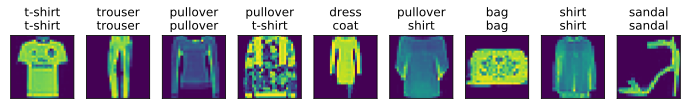

In [24]:
for X, y in test_iter:
    break

true_labels = gb.get_fashion_mnist_labels(y.asnumpy())
pred_labels = gb.get_fashion_mnist_labels(net(X).argmax(axis=1).asnumpy())
titles = [true + '\n' + pred for true, pred in zip(true_labels, pred_labels)]

gb.show_fashion_mnist(X[0:9], titles[0:9])